# Part 1: Dataset Overview and Exploration

## Fitness Tracker Sensor Dataset

This dataset contains synchronized readings from accelerometer and gyroscope sensors, collected as participants perform various exercises.

---

### Dataset Features

- **epoch (ms):** Timestamp of each sensor reading.
- **Accelerometer_x / y / z:** Acceleration along x, y, z axes.
- **Gyroscope_x / y / z:** Rotational velocity around x, y, z axes.
- **Participants:** Unique ID for each participant.
- **Label:** Exercise being performed (e.g., bench press, squat).
- **Category:** Intensity level (e.g., heavy, moderate).
- **Set:** Set number within the session.

------

### Possible Uses

- Human activity recognition
- Exercise classification
- Intensity estimation
- Sensor data analysis

------

Find more details and download the dataset on [Kaggle](https://www.kaggle.com/datasets/krishujeniya/fitness-tracker-accelerometer-and-gyroscope-data).

---

### Studying the Dataset

In this part, we will:
- Load the dataset and inspect its structure.
- Explore the available features and their data types.
- Examine the distribution of classes and participants.
- Visualize sensor readings to understand the data patterns for different exercises and participants.

This initial exploration provides a foundation for preprocessing, feature extraction, and further analysis in the following parts.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import DBSCAN
from helper.tools import OutlierDetection

from helper.tools import PrincipalComponentAnalysis
from helper.tools import LowPassFilter
from helper.tools import MeanTemporalAbstraction
from sklearn.cluster import KMeans

from sklearn.model_selection import train_test_split
import seaborn as sns
import itertools
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
from helper.algorithms import ClassificationAlgorithms


# plot settings
%matplotlib inline
plt.style.use('seaborn-v0_8-deep')
plt.rcParams['figure.figsize'] = [20, 5]
plt.rcParams['figure.dpi'] = 100

In [3]:
# Load the data
df = pd.read_csv('../initial_data/data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9009 entries, 0 to 9008
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   epoch (ms)       9009 non-null   object 
 1   Accelerometer_x  9009 non-null   float64
 2   Accelerometer_y  9009 non-null   float64
 3   Accelerometer_z  9009 non-null   float64
 4   Gyroscope_x      9009 non-null   float64
 5   Gyroscope_y      9009 non-null   float64
 6   Gyroscope_z      9009 non-null   float64
 7   Participants     9009 non-null   object 
 8   Label            9009 non-null   object 
 9   Category         9009 non-null   object 
 10  Set              9009 non-null   int64  
dtypes: float64(6), int64(1), object(4)
memory usage: 774.3+ KB


In [4]:
df.isna().sum()

epoch (ms)         0
Accelerometer_x    0
Accelerometer_y    0
Accelerometer_z    0
Gyroscope_x        0
Gyroscope_y        0
Gyroscope_z        0
Participants       0
Label              0
Category           0
Set                0
dtype: int64

In [5]:
df

,epoch (ms),Accelerometer_x,Accelerometer_y,Accelerometer_z,Gyroscope_x,Gyroscope_y,Gyroscope_z,Participants,Label,Category,Set
0,2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,B,bench,heavy,30
1,2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,B,bench,heavy,30
2,2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,B,bench,heavy,30
3,2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,B,bench,heavy,30
4,2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...,...
9004,2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,E,row,medium,40
9005,2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,E,row,medium,40
9006,2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,E,row,medium,40
9007,2019-01-20 17:33:27.600,-0.038667,-1.025667,-0.044667,-0.2318,0.2562,1.1220,E,row,medium,40


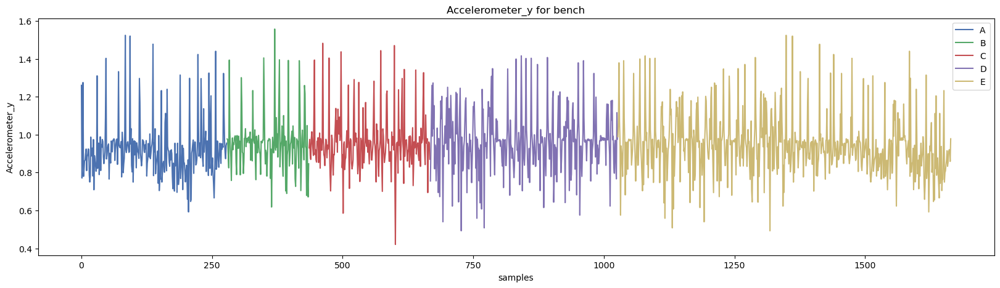

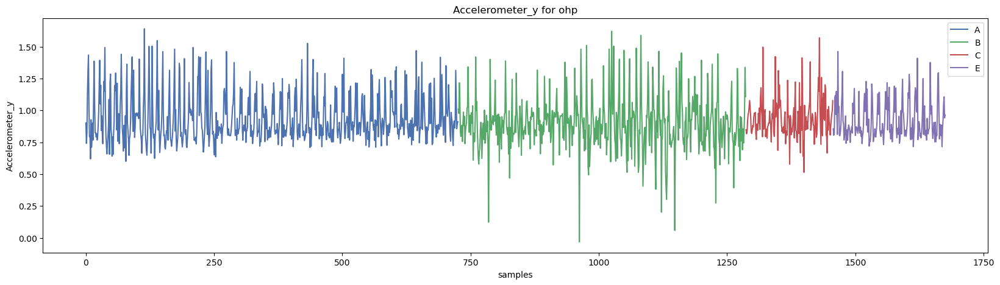

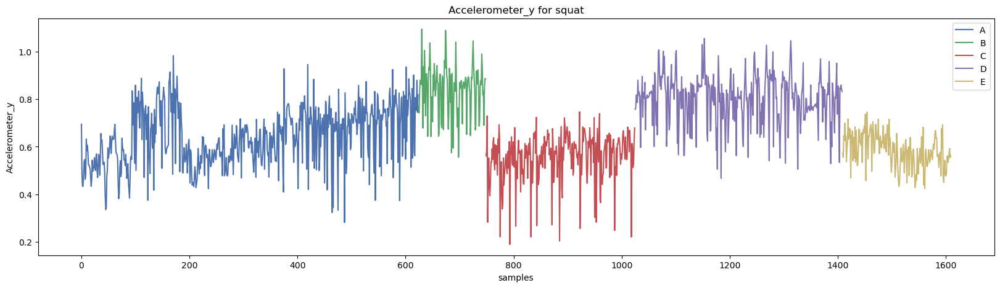

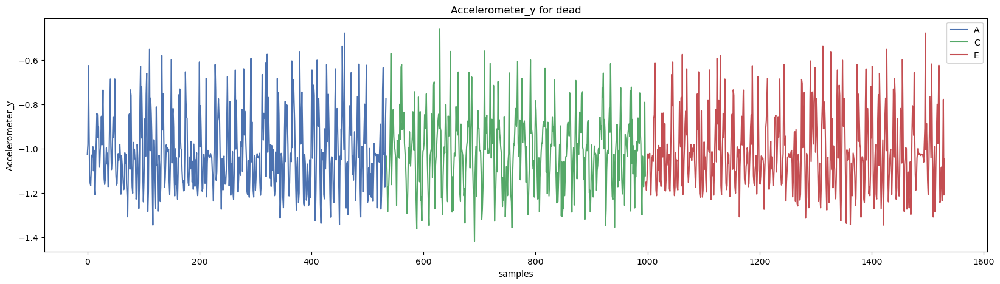

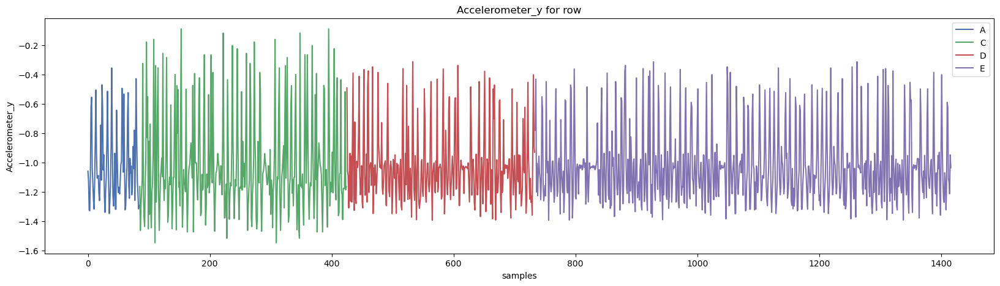

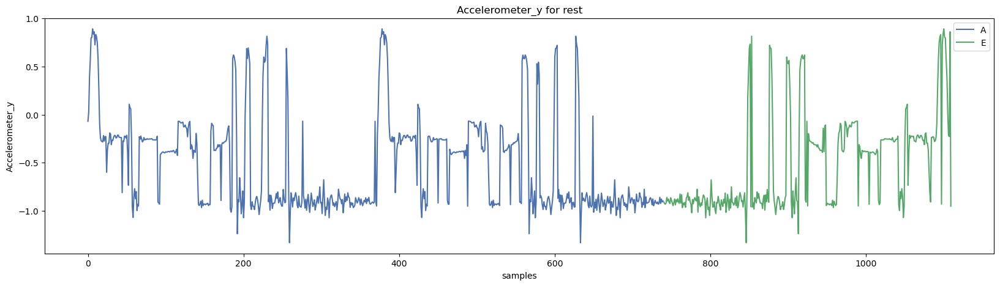

In [6]:
# comparing the participants for each exercise 
labels = df['Label'].unique()

for label in labels:
    participant_df = df.query(f'Label == "{label}"').sort_values(by=["Participants"]).reset_index()
    
    fig, ax = plt.subplots()
    participant_df.groupby(["Participants"])["Accelerometer_y"].plot(ax=ax)
    ax.set_title(f'Accelerometer_y for {label}')
    ax.set_ylabel("Accelerometer_y")
    ax.set_xlabel("samples")
    plt.legend()
    plt.show()

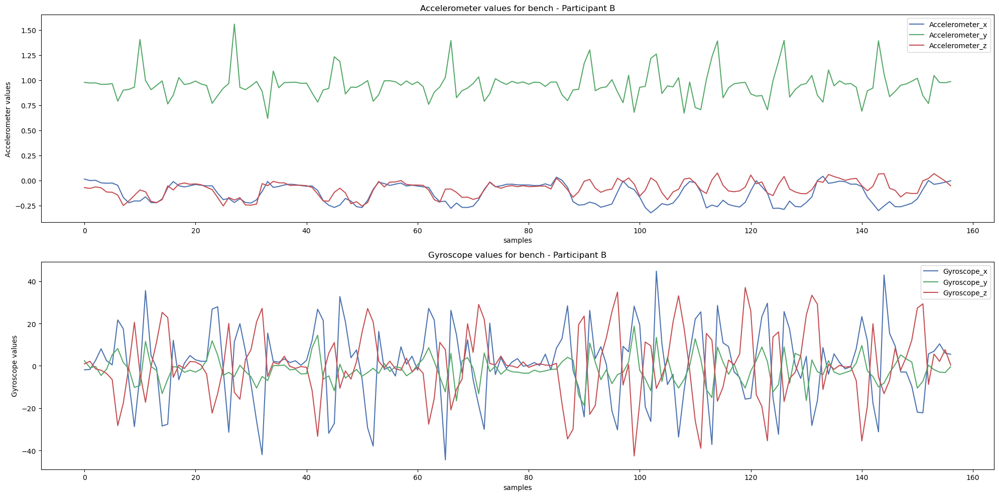

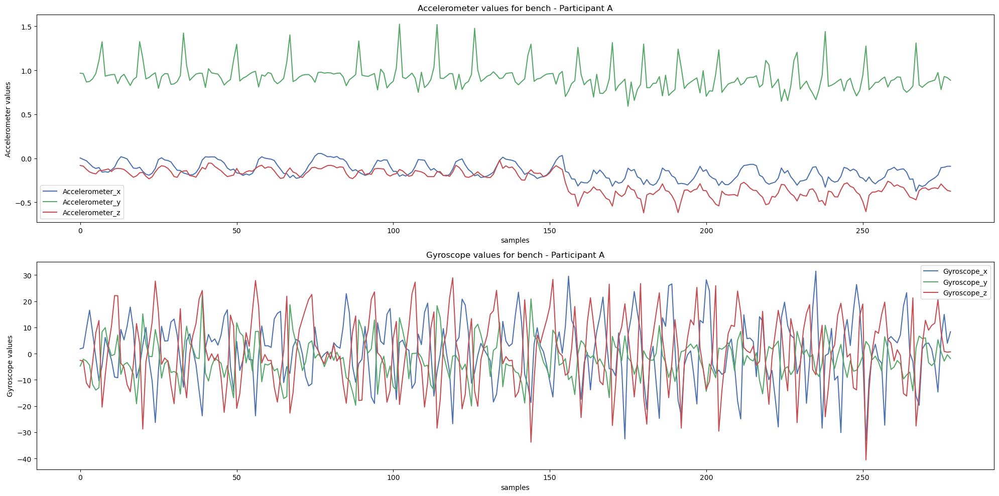

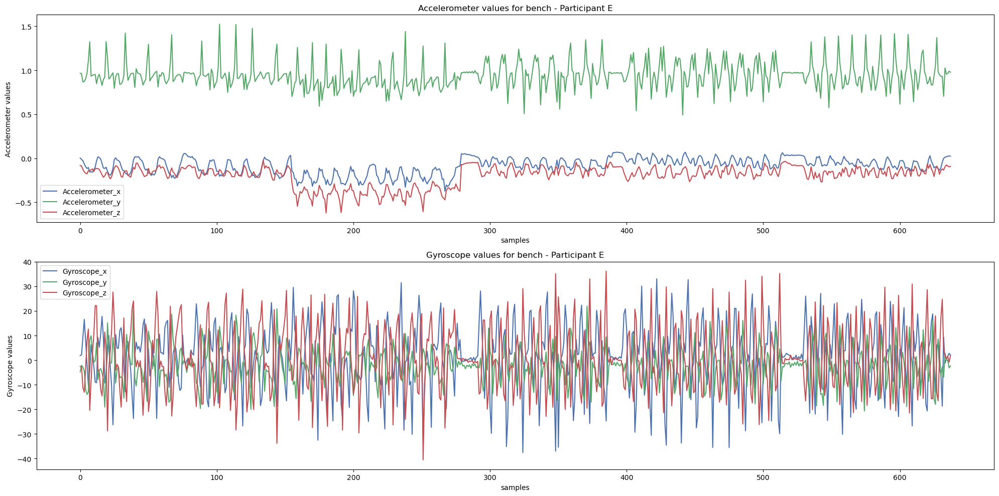

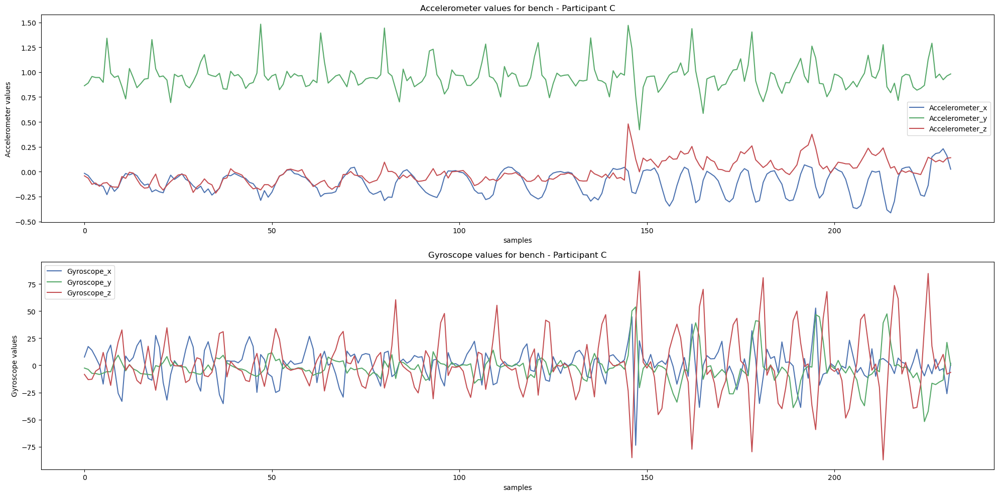

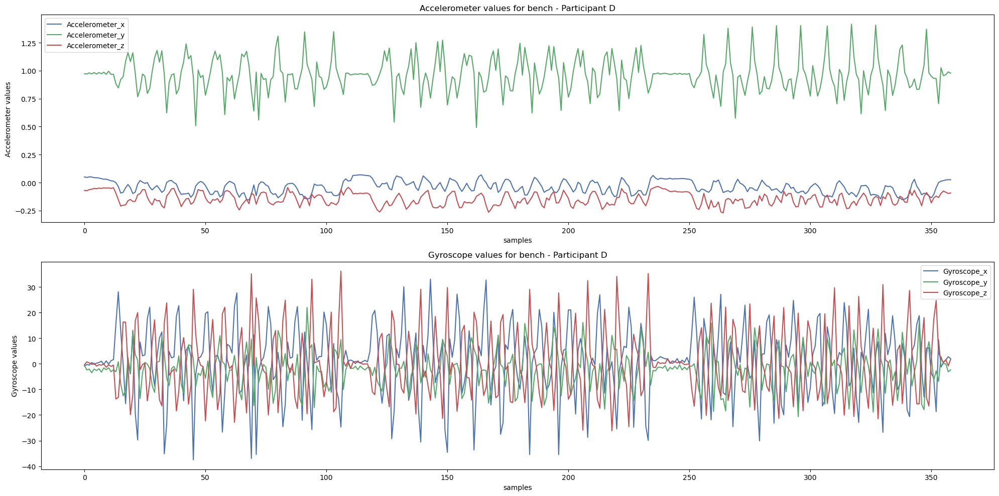

...

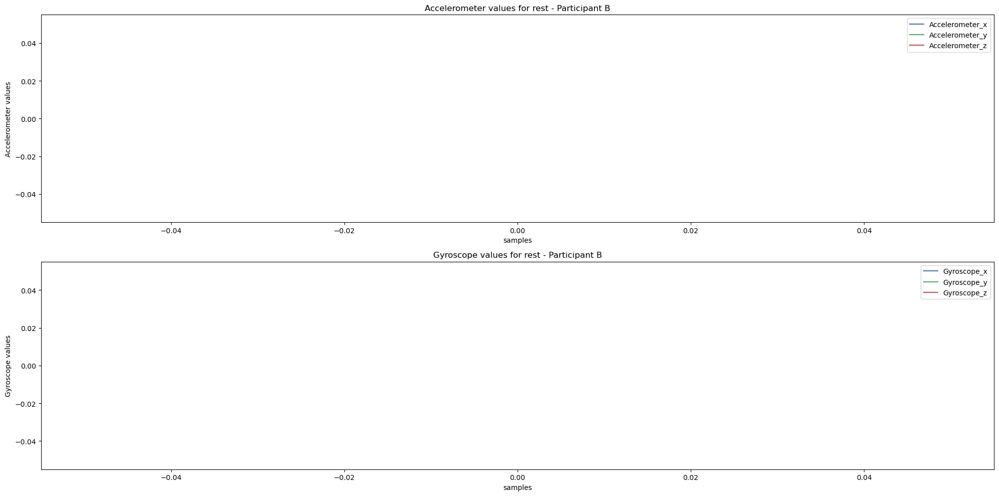

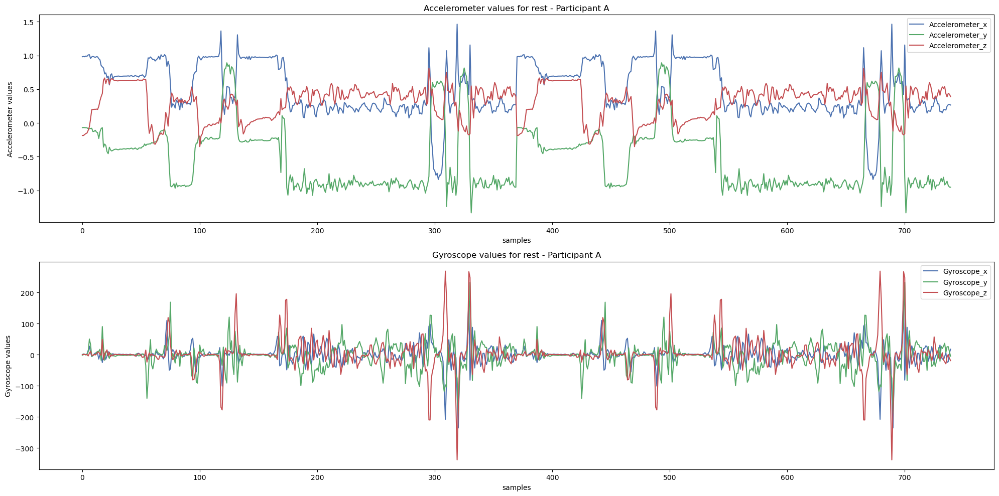

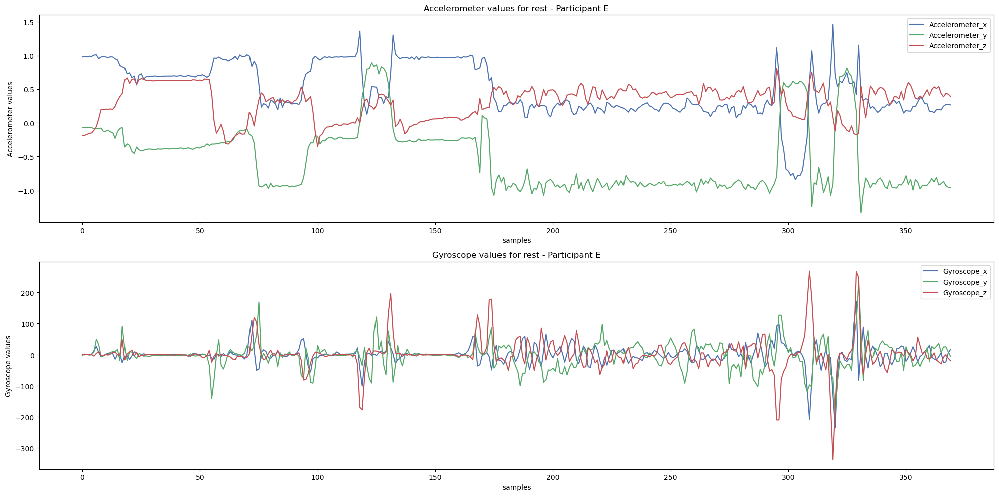

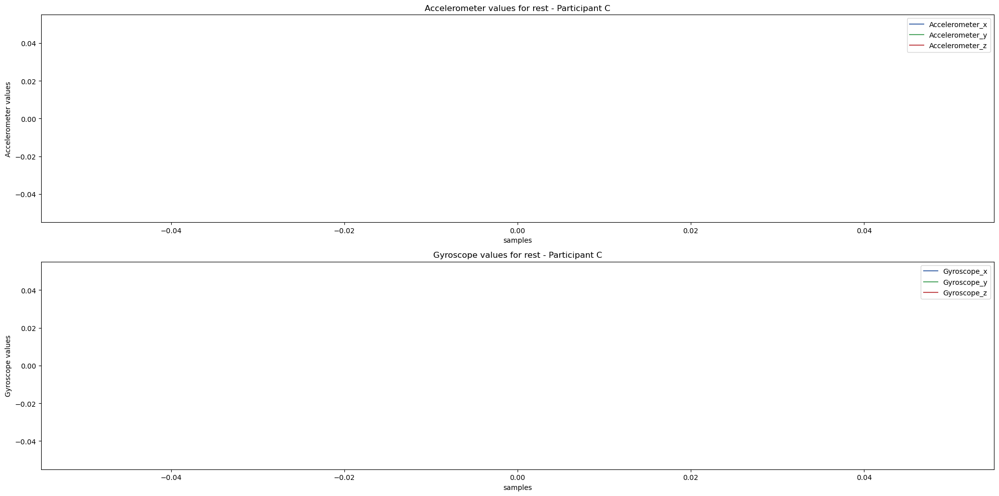

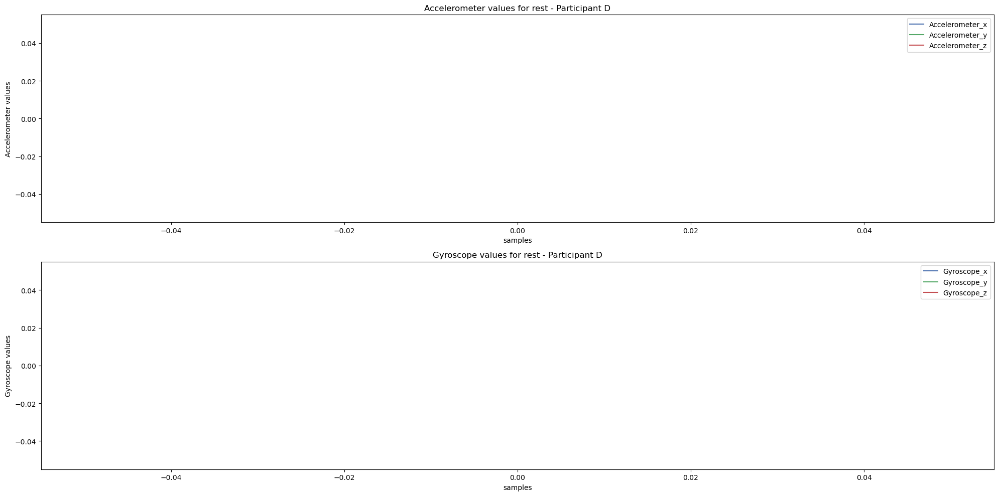

In [7]:
# plotting how the accelerometer and gyroscope values are measured for each exercise and for each participant
labels = df['Label'].unique()
participants = df['Participants'].unique()

for label in labels:
    for participant in participants:
        all_axes_df = df.query('Label == @label').query('Participants == @participant').reset_index()
        
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))
        
        all_axes_df[['Accelerometer_x', 'Accelerometer_y', 'Accelerometer_z']].plot(ax=ax1)
        ax1.set_title(f'Accelerometer values for {label} - Participant {participant}')
        ax1.set_ylabel("Accelerometer values")
        ax1.set_xlabel("samples")
        ax1.legend()
        
        all_axes_df[['Gyroscope_x', 'Gyroscope_y', 'Gyroscope_z']].plot(ax=ax2)
        ax2.set_title(f'Gyroscope values for {label} - Participant {participant}')
        ax2.set_ylabel("Gyroscope values")
        ax2.set_xlabel("samples")
        ax2.legend()
        
        plt.tight_layout()
        plt.show()

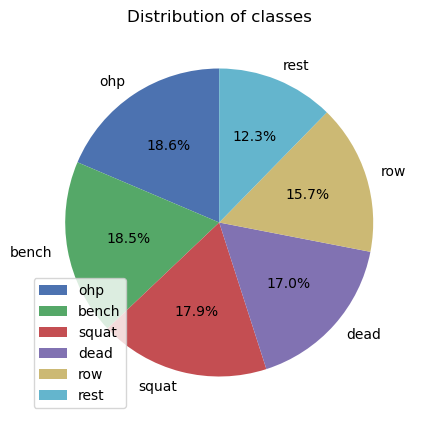

In [8]:
# can you mkae me a tort plot that shows the classes labes how they are distributed
labels = df['Label'].unique()
labels_count = df['Label'].value_counts()
labels_count = labels_count.reset_index()
labels_count.columns = ['Label', 'Count']
labels_count
fig, ax = plt.subplots()
labels_count.plot.pie(y='Count', labels=labels_count['Label'], ax=ax, autopct='%1.1f%%', startangle=90)
ax.set_ylabel('')
ax.set_title('Distribution of classes')
plt.show()

### Why did I choose this dataset?

It provides real-world sensor data for activity recognition, making it ideal for practicing time-series analysis and feature extraction.

----

## Part 2: Handling Outliers

### Detecting and Handling Outliers with DBSCAN

In this section, we will identify outliers in the dataset using the DBSCAN algorithm and handle them through interpolation.  
We will focus only on the accelerometer and gyroscope columns.

In [9]:
df.columns

Index(['epoch (ms)', 'Accelerometer_x', 'Accelerometer_y', 'Accelerometer_z',
       'Gyroscope_x', 'Gyroscope_y', 'Gyroscope_z', 'Participants', 'Label',
       'Category', 'Set'],
      dtype='object')

In [10]:
outliers_cols = list(df.columns[1:7])
outliers_cols

['Accelerometer_x',
 'Accelerometer_y',
 'Accelerometer_z',
 'Gyroscope_x',
 'Gyroscope_y',
 'Gyroscope_z']

##### BOXPLOT

The following boxplot visualizes the distribution and potential outliers for each accelerometer and gyroscope axis in the dataset:


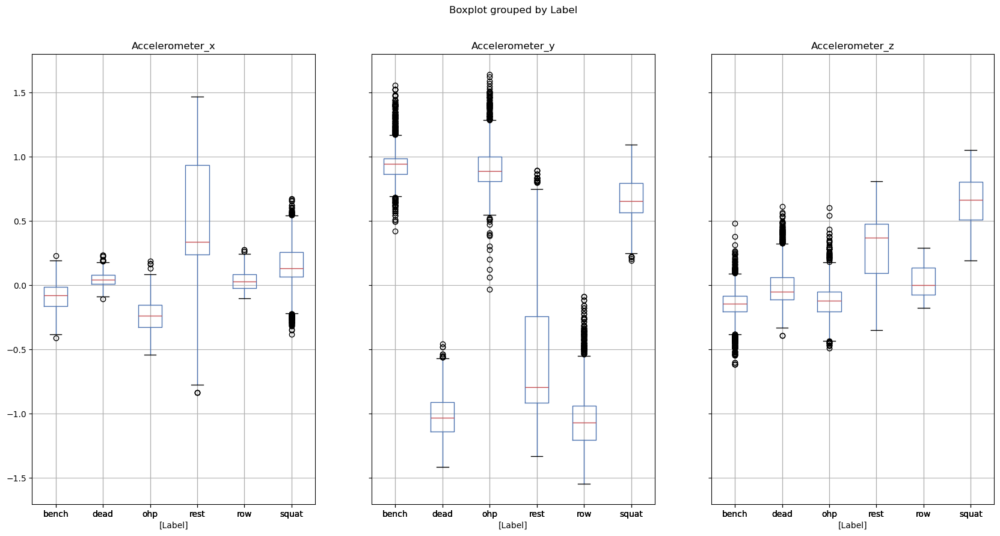

In [11]:
# accelerator data 
df[outliers_cols[:3] + ["Label"]].boxplot(by="Label", figsize = (20, 10), layout = (1, 3))
plt.show()

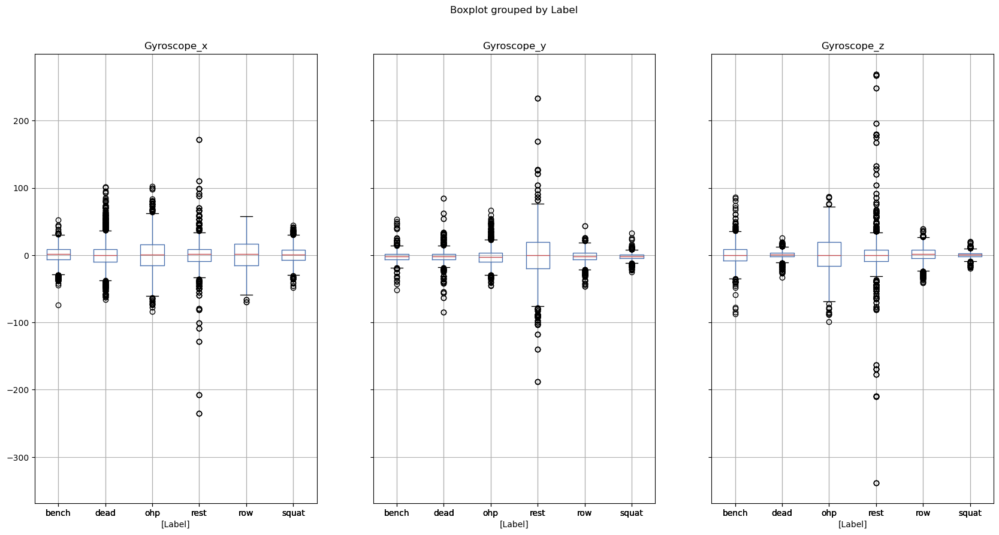

In [12]:
# gyroscope data
df[outliers_cols[3:] + ["Label"]].boxplot(by="Label", figsize = (20, 10), layout = (1, 3))
plt.show()

#### Chacking the distribution of the data


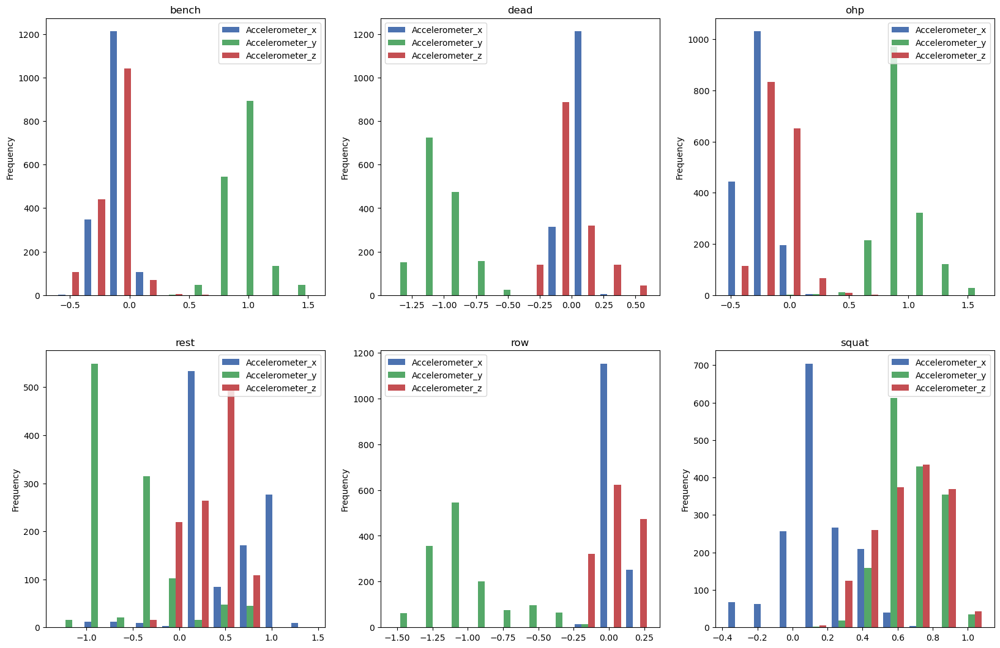

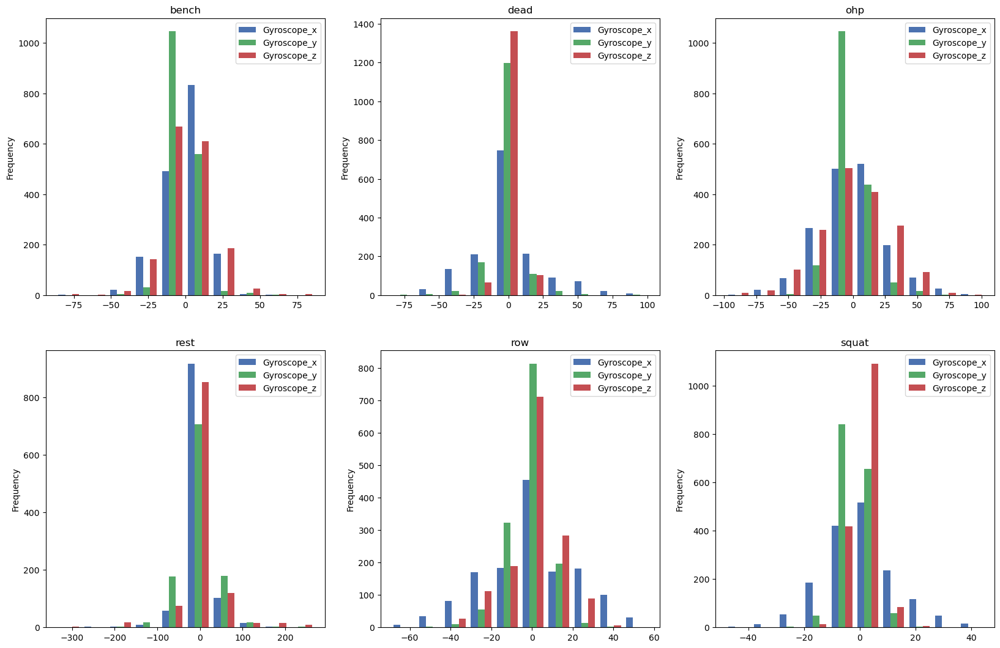

In [13]:
# first let's check the distribution of the data
df[outliers_cols[:3] + ["Label"]].plot.hist(by="Label", figsize = (20, 20), layout = (3, 3))
df[outliers_cols[3:] + ["Label"]].plot.hist(by="Label", figsize = (20, 20), layout = (3, 3))

plt.show()

In [14]:
# class 
od = OutlierDetection()
# check the normal distribution
od.check_normal_distribution(df, outliers_cols)


Accelerometer_x is not normally distributed (p-value: 0.0)
Accelerometer_y is not normally distributed (p-value: 0.0)
Accelerometer_z is not normally distributed (p-value: 4.924779460496606e-188)
Gyroscope_x is not normally distributed (p-value: 0.0)
Gyroscope_y is not normally distributed (p-value: 0.0)
Gyroscope_z is not normally distributed (p-value: 0.0)


### DBSCAN tuning Grid Search

In [15]:
# finding the best eps and min_samples
best_eps, best_min_samples, df_scaled = od.tune_dbscan(df, outliers_cols)

Starting DBSCAN tuning: 304 total combinations to check...

Checking eps = 0.10
  Step 1/304: eps=0.10, min_samples=5 --> Clusters: 26, Outliers: 8566, Silhouette Score: 0.5451
  Step 2/304: eps=0.10, min_samples=6 --> Clusters: 22, Outliers: 8588, Silhouette Score: 0.5881
  Step 3/304: eps=0.10, min_samples=7 --> Clusters: 13, Outliers: 8654, Silhouette Score: 0.5346
  Step 4/304: eps=0.10, min_samples=8 --> Clusters: 11, Outliers: 8685, Silhouette Score: 0.6075
  Step 5/304: eps=0.10, min_samples=9 --> Clusters: 10, Outliers: 8697, Silhouette Score: 0.6101
  Step 6/304: eps=0.10, min_samples=10 --> Clusters: 8, Outliers: 8717, Silhouette Score: 0.6498
  Step 7/304: eps=0.10, min_samples=11 --> Clusters: 8, Outliers: 8744, Silhouette Score: 0.6911
  Step 8/304: eps=0.10, min_samples=12 --> Clusters: 6, Outliers: 8766, Silhouette Score: 0.6940
  Step 9/304: eps=0.10, min_samples=13 --> Clusters: 4, Outliers: 8796, Silhouette Score: 0.9451
  Step 10/304: eps=0.10, min_samples=14 --> Clu

### Outliers Intrapolation (Linear Interpolation)
- **DbScan Detected Outliers** best hyperparameters: `eps=1.6`, `min_samples=7`, with: `scilhouette_score=0.4262`

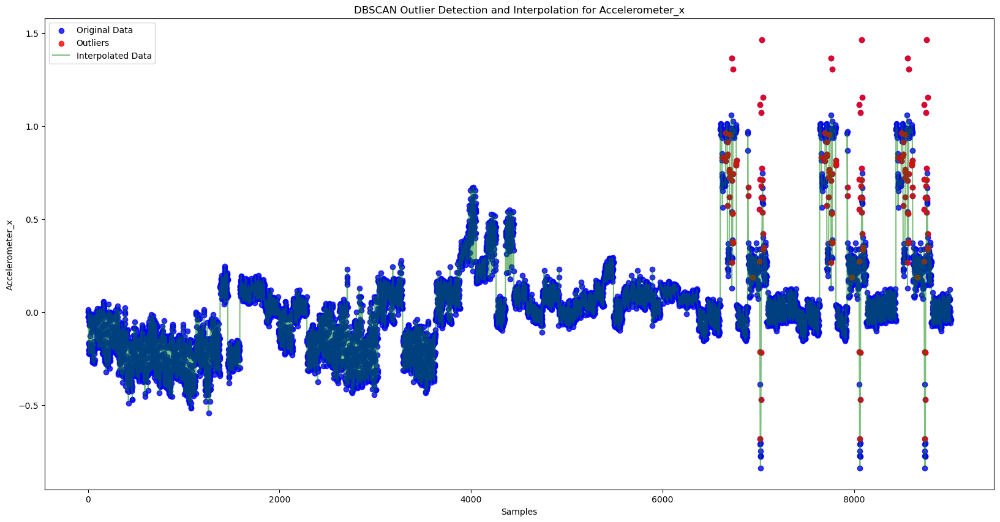

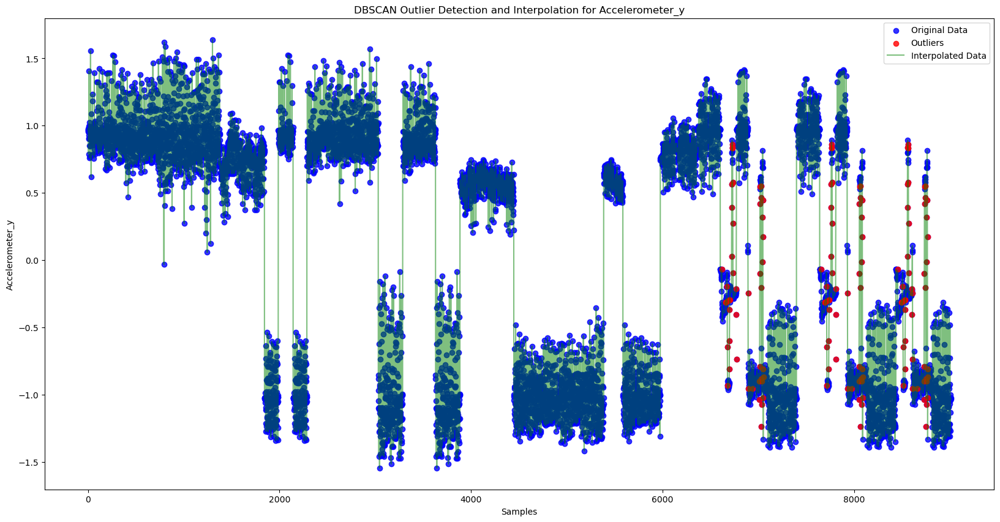

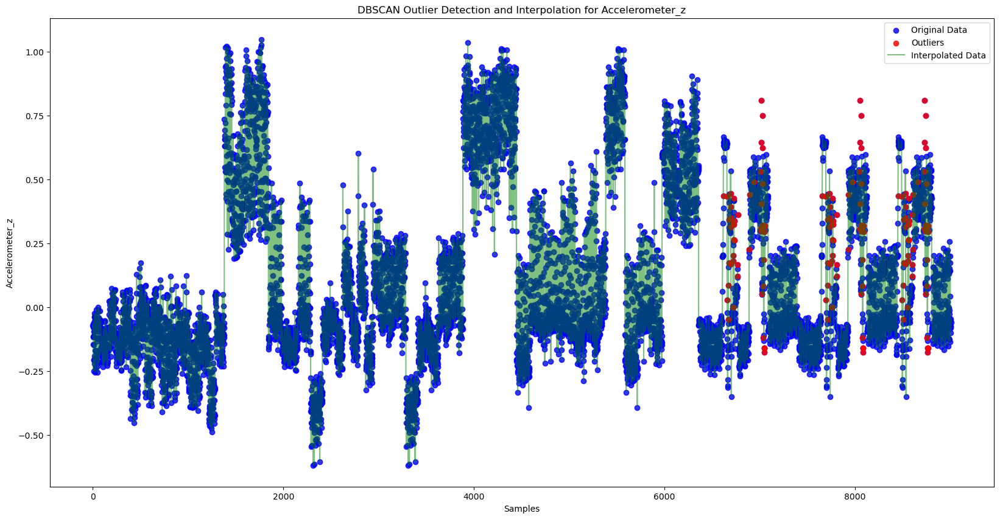

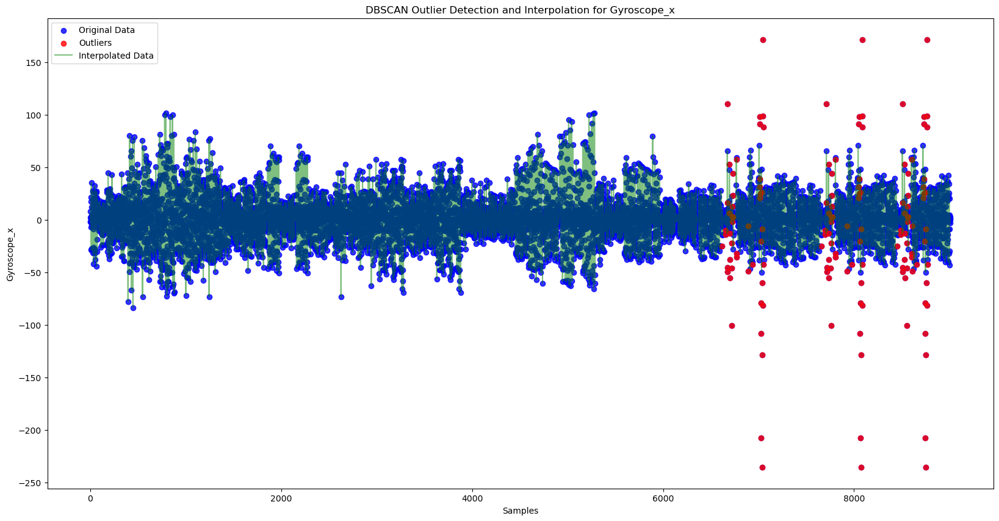

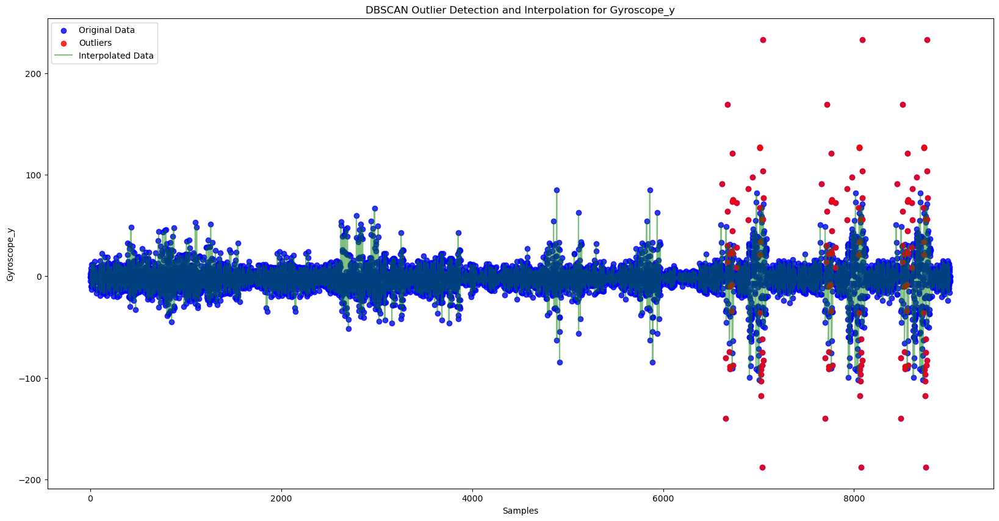

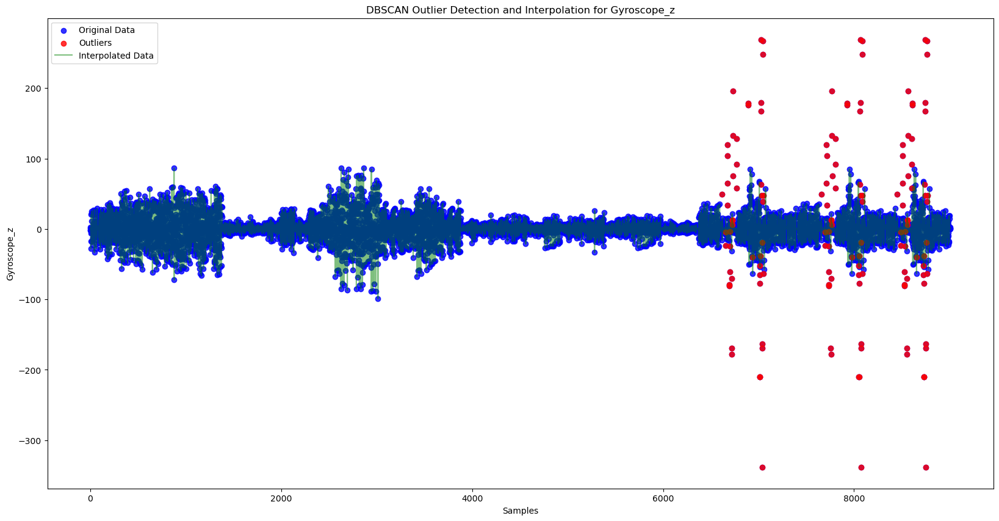

In [16]:

# Apply DBSCAN with the best hyperparameters
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
outlier_labels = dbscan.fit_predict(df_scaled[outliers_cols])
    
# Outliers
outliers = df[outlier_labels == -1]
    
df_interpolated = df.copy()
for col in outliers_cols:
    # Interpolating the outliers
    df_interpolated[col] = df[col].where(outlier_labels != -1).interpolate(method='linear')
    
# Plot the outliers and interpolated data
for col in outliers_cols:
    plt.figure(figsize=(20, 10))
    
    # Plot original data with outliers
    plt.scatter(df.index, df[col], c='blue', label='Original Data', alpha=0.8)
    plt.scatter(outliers.index, outliers[col], c='red', label='Outliers', alpha=0.8)
    
    # Plot interpolated data
    plt.plot(df_interpolated.index, df_interpolated[col], c='green', label='Interpolated Data', alpha=0.5)
    
    plt.xlabel('Samples')
    plt.ylabel(col)
    plt.title(f'DBSCAN Outlier Detection and Interpolation for {col}')
    plt.legend()
    plt.show()

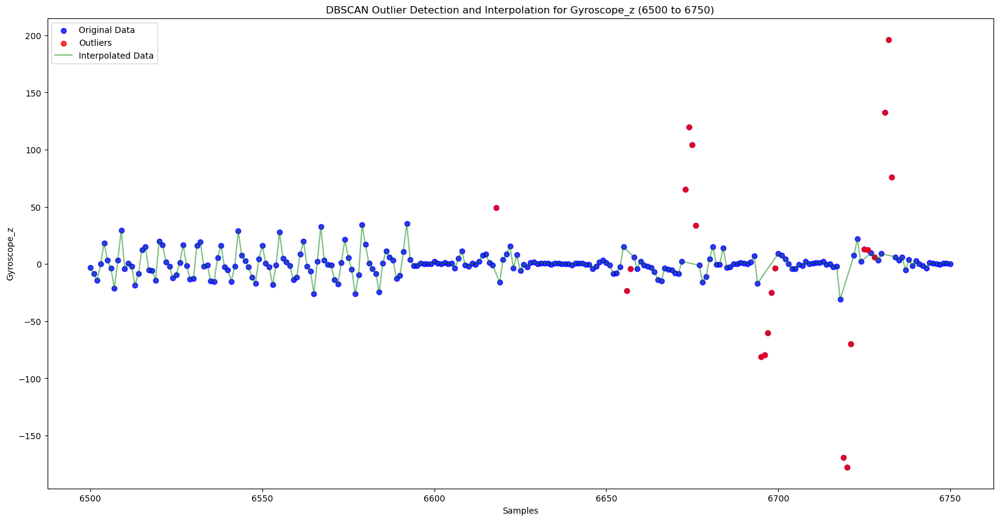

In [17]:
# Plot the outliers and interpolated data for Gyroscope_z in the range 6500 to 6750
plt.figure(figsize=(20, 10))

# Plot original data with outliers
plt.scatter(df.index[6500:6751], df.loc[6500:6750, "Gyroscope_z"], c='blue', label='Original Data', alpha=0.8)
plt.scatter(outliers.index[(outliers.index >= 6500) & (outliers.index <= 6750)], 
            outliers.loc[(outliers.index >= 6500) & (outliers.index <= 6750), "Gyroscope_z"], 
            c='red', label='Outliers', alpha=0.8)

# Plot interpolated data
plt.plot(df_interpolated.index[6500:6751], df_interpolated.loc[6500:6750, "Gyroscope_z"], 
         c='green', label='Interpolated Data', alpha=0.5)

plt.xlabel('Samples')
plt.ylabel('Gyroscope_z')
plt.title('DBSCAN Outlier Detection and Interpolation for Gyroscope_z (6500 to 6750)')
plt.legend()
plt.show()


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9009 entries, 0 to 9008
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   epoch (ms)       9009 non-null   object 
 1   Accelerometer_x  9009 non-null   float64
 2   Accelerometer_y  9009 non-null   float64
 3   Accelerometer_z  9009 non-null   float64
 4   Gyroscope_x      9009 non-null   float64
 5   Gyroscope_y      9009 non-null   float64
 6   Gyroscope_z      9009 non-null   float64
 7   Participants     9009 non-null   object 
 8   Label            9009 non-null   object 
 9   Category         9009 non-null   object 
 10  Set              9009 non-null   int64  
dtypes: float64(6), int64(1), object(4)
memory usage: 774.3+ KB


In [19]:
df_interpolated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9009 entries, 0 to 9008
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   epoch (ms)       9009 non-null   object 
 1   Accelerometer_x  9009 non-null   float64
 2   Accelerometer_y  9009 non-null   float64
 3   Accelerometer_z  9009 non-null   float64
 4   Gyroscope_x      9009 non-null   float64
 5   Gyroscope_y      9009 non-null   float64
 6   Gyroscope_z      9009 non-null   float64
 7   Participants     9009 non-null   object 
 8   Label            9009 non-null   object 
 9   Category         9009 non-null   object 
 10  Set              9009 non-null   int64  
dtypes: float64(6), int64(1), object(4)
memory usage: 774.3+ KB


In [20]:
# check is the dataset are equal
df_interpolated.equals(df)

False

# Part 3: Filtering, Feature Extraction, Clustering, and Dimensionality Reduction with PCA

In this section, we will apply filtering and feature extraction techniques to our dataset.  
We will then use clustering algorithms to explore the structure of the data, and apply Principal Component Analysis (PCA) to reduce its dimensionality for visualization and further analysis.


In [21]:
df = df_interpolated.copy()
columns = list(df.columns[1:7])
columns_acc = list(df.columns[1:4])
columns_gyro = list(df.columns[4:7])

#### Low-Pass Filtering

A low-pass filter smooths the sensor signals by removing high-frequency noise, making patterns in the data easier to analyze.  
We will apply a low-pass filter to the accelerometer and gyroscope columns using a sampling frequency of 1 Hz and a cutoff frequency of 1.2 Hz.

squat


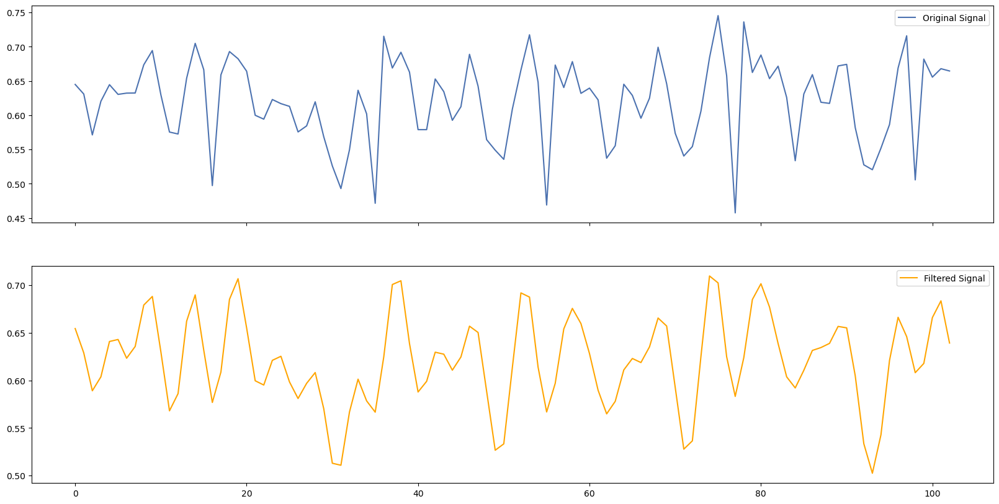

In [22]:
df_filtered = df.copy()

lpf = LowPassFilter()

# Set filter parameters
sampling_frequency = 1000 / 200  # one second sempling frequency
cutoff_frequency = 1.2

# Apply low-pass filter to the "Accelerometer_y" column
df_filtered = lpf.low_pass_filter(df_filtered, "Accelerometer_y", sampling_frequency, cutoff_frequency)

# Filter the subset where "Set" equals 45
subset = df_filtered[df_filtered["Set"] == 45]

# Print the first label in the subset
print(subset["Label"].iloc[0])

# Plot the original and filtered signals
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20, 10))
ax[0].plot(subset["Accelerometer_y"].reset_index(drop=True), label="Original Signal")
ax[1].plot(subset["Accelerometer_y_lowpass"].reset_index(drop=True), label="Filtered Signal", color="orange")

# Add legends
ax[0].legend()
ax[1].legend()

plt.show()


In [23]:
# applying the filter to all the data
for col in columns:
    df_filtered = lpf.low_pass_filter(df_filtered, col, sampling_frequency, cutoff_frequency)
    df_filtered[col] = df_filtered[f"{col}_lowpass"]
    df_filtered.drop(columns=[f"{col}_lowpass"], inplace=True)

#### Principal Component Analysis (PCA)

PCA reduces the number of features while keeping most of the data's variance. It helps visualize high-dimensional sensor data and reveals patterns for further analysis.

In [24]:
PCA = PrincipalComponentAnalysis()
df_pca = df_filtered.copy()

values = PCA.pca_variance(df_pca, columns)
values

array([0.51727973, 0.2479823 , 0.10955084, 0.06296472, 0.04356126,
       0.01866114])

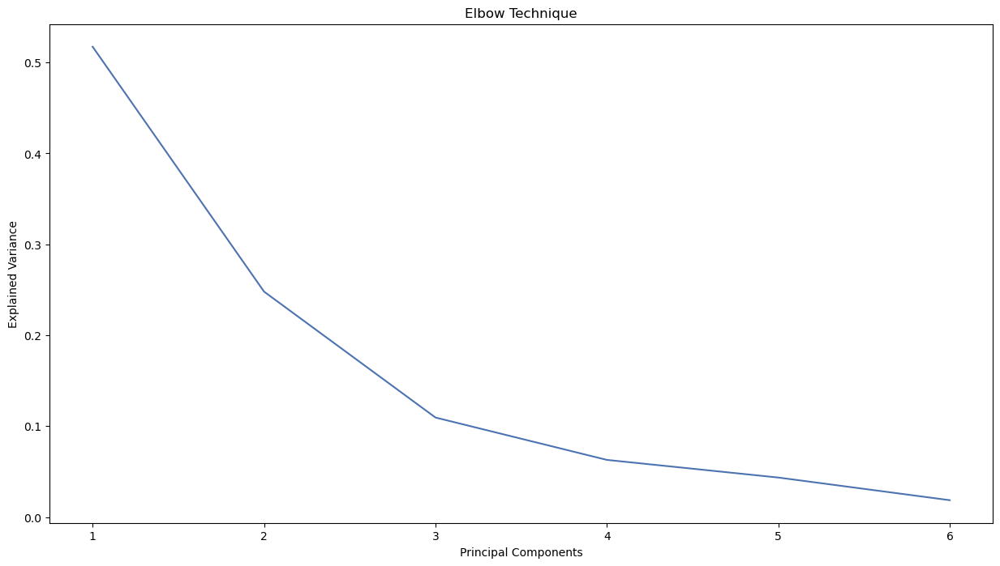

In [25]:
# Elbow technique
plt.figure(figsize=(15, 8))
plt.plot(range(1, len(columns) + 1), values)
plt.xlabel("Principal Components")
plt.ylabel("Explained Variance")
plt.title("Elbow Technique")
plt.show()

In [26]:
# apply pca based on the elbow technique
n_components = 3
df_pca = PCA.apply_pca(df_pca, columns, n_components)
df_pca.head()

,epoch (ms),Accelerometer_x,Accelerometer_y,Accelerometer_z,Gyroscope_x,Gyroscope_y,Gyroscope_z,Participants,Label,Category,Set,pca_1,pca_2,pca_3
0,2019-01-11 15:08:05.200,0.013494,0.977006,-0.070995,-1.896395,2.439080,0.939616,B,bench,heavy,30,0.314359,-0.070372,-0.008262
1,2019-01-11 15:08:05.400,0.006869,0.970289,-0.067545,2.129685,0.528678,-1.248135,B,bench,heavy,30,0.312210,-0.069619,0.023938
2,2019-01-11 15:08:05.600,-0.009603,0.963587,-0.073447,4.151973,-2.092258,-0.929804,B,bench,heavy,30,0.311589,-0.076614,0.034194
3,2019-01-11 15:08:05.800,-0.022998,0.965380,-0.083731,2.074477,-3.626288,0.880509,B,bench,heavy,30,0.314086,-0.085540,0.014296
4,2019-01-11 15:08:06.000,-0.020032,0.966778,-0.093783,1.041930,-1.219897,-2.260590,B,bench,heavy,30,0.314520,-0.090446,0.020805


<Axes: >

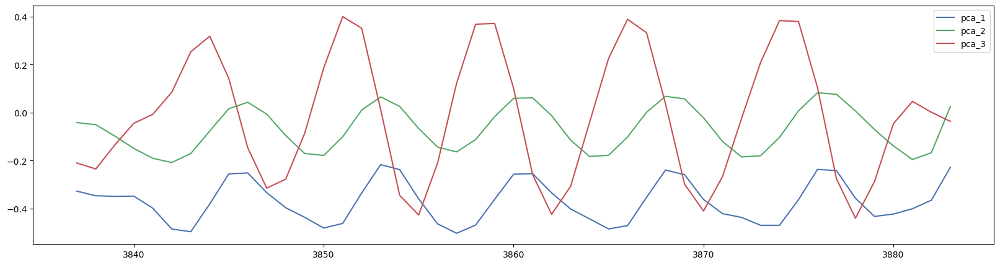

In [27]:
# Plot the PCA results
subset = df_pca[df_pca["Set"] == 35]
subset[["pca_1", "pca_2", "pca_3"]].plot()

#### Squaring Sensor Features Exctraction

Squaring sensor features (e.g., `Accelerometer_x^2`) highlights larger values and captures movement intensity, adding useful non-linear information for activity recognition and signal analysis.


In [28]:
df_squered = df_pca.copy()
Accelerometer_r = df_squered["Accelerometer_x"]**2 + df_squered["Accelerometer_y"]**2 + df_squered["Accelerometer_z"]**2
Gyroscope_r = df_squered["Gyroscope_x"]**2 + df_squered["Gyroscope_y"]**2 + df_squered["Gyroscope_z"]**2

df_squered["Accelerometer_r"] = np.sqrt(Accelerometer_r)
df_squered["Gyroscope_r"] = np.sqrt(Gyroscope_r)
df_squered.head()

,epoch (ms),Accelerometer_x,Accelerometer_y,Accelerometer_z,Gyroscope_x,Gyroscope_y,Gyroscope_z,Participants,Label,Category,Set,pca_1,pca_2,pca_3,Accelerometer_r,Gyroscope_r
0,2019-01-11 15:08:05.200,0.013494,0.977006,-0.070995,-1.896395,2.439080,0.939616,B,bench,heavy,30,0.314359,-0.070372,-0.008262,0.979675,3.229288
1,2019-01-11 15:08:05.400,0.006869,0.970289,-0.067545,2.129685,0.528678,-1.248135,B,bench,heavy,30,0.312210,-0.069619,0.023938,0.972662,2.524460
2,2019-01-11 15:08:05.600,-0.009603,0.963587,-0.073447,4.151973,-2.092258,-0.929804,B,bench,heavy,30,0.311589,-0.076614,0.034194,0.966430,4.741409
3,2019-01-11 15:08:05.800,-0.022998,0.965380,-0.083731,2.074477,-3.626288,0.880509,B,bench,heavy,30,0.314086,-0.085540,0.014296,0.969277,4.269510
4,2019-01-11 15:08:06.000,-0.020032,0.966778,-0.093783,1.041930,-1.219897,-2.260590,B,bench,heavy,30,0.314520,-0.090446,0.020805,0.971522,2.772009


array([<Axes: >, <Axes: >], dtype=object)

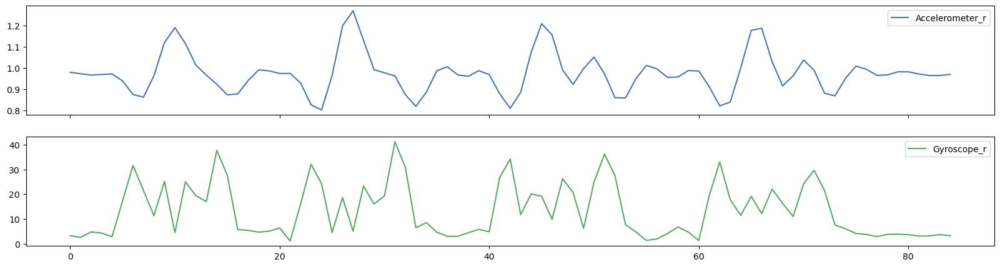

In [29]:
# Plot the squared values
subset = df_squered[df_squered["Set"] == 30]
subset[["Accelerometer_r", "Gyroscope_r"]].plot(subplots=True)

#### Mean feature extraction

- Using a window size of 1000 ms, we will extract the mean of each sensor feature (accelerometer and gyroscope) to summarize the data over time.

- Extracting the mean in each window helps smooth out the data and reduces the effect of random noise. This makes it easier to see the main patterns in the sensor signals.


In [30]:
mean = MeanTemporalAbstraction()
df_mean = df_squered.copy()

ws = int(1000/200)  # window size

df_mean_list = []
columns = columns+["Accelerometer_r", "Gyroscope_r"]
for set in df_mean["Set"].unique():
    subset = df_mean[df_mean["Set"] == set].copy()
    for col in columns:
        subset = mean.abstract_mean(subset, [col], ws)
    df_mean_list.append(subset)
df_mean = pd.concat(df_mean_list, ignore_index=True)

df_mean.head()


,epoch (ms),Accelerometer_x,Accelerometer_y,Accelerometer_z,Gyroscope_x,Gyroscope_y,Gyroscope_z,Participants,Label,Category,...,Accelerometer_r,Gyroscope_r,Accelerometer_x_temp_mean_ws_5,Accelerometer_y_temp_mean_ws_5,Accelerometer_z_temp_mean_ws_5,Gyroscope_x_temp_mean_ws_5,Gyroscope_y_temp_mean_ws_5,Gyroscope_z_temp_mean_ws_5,Accelerometer_r_temp_mean_ws_5,Gyroscope_r_temp_mean_ws_5
0,2019-01-11 15:08:05.200,0.013494,0.977006,-0.070995,-1.896395,2.439080,0.939616,B,bench,heavy,...,0.979675,3.229288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-11 15:08:05.400,0.006869,0.970289,-0.067545,2.129685,0.528678,-1.248135,B,bench,heavy,...,0.972662,2.524460,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-11 15:08:05.600,-0.009603,0.963587,-0.073447,4.151973,-2.092258,-0.929804,B,bench,heavy,...,0.966430,4.741409,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-11 15:08:05.800,-0.022998,0.965380,-0.083731,2.074477,-3.626288,0.880509,B,bench,heavy,...,0.969277,4.269510,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-11 15:08:06.000,-0.020032,0.966778,-0.093783,1.041930,-1.219897,-2.260590,B,bench,heavy,...,0.971522,2.772009,-0.006454,0.968608,-0.0779,1.500334,-0.794137,-0.523681,0.971913,3.507335


<Axes: >

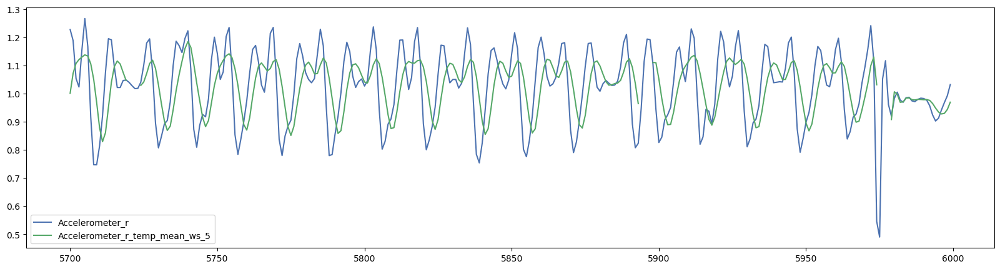

In [31]:
df_mean[["Accelerometer_r", "Accelerometer_r_temp_mean_ws_5"]].iloc[5700:6000].plot()

In [32]:
df_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9009 entries, 0 to 9008
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   epoch (ms)                      9009 non-null   object 
 1   Accelerometer_x                 9009 non-null   float64
 2   Accelerometer_y                 9009 non-null   float64
 3   Accelerometer_z                 9009 non-null   float64
 4   Gyroscope_x                     9009 non-null   float64
 5   Gyroscope_y                     9009 non-null   float64
 6   Gyroscope_z                     9009 non-null   float64
 7   Participants                    9009 non-null   object 
 8   Label                           9009 non-null   object 
 9   Category                        9009 non-null   object 
 10  Set                             9009 non-null   int64  
 11  pca_1                           9009 non-null   float64
 12  pca_2                           90

#### Handling Missing Values

To fill missing values (NaNs) in the dataset, we use the mean of each column. This keeps the data complete and avoids losing information.

In [33]:
df_mean.isnull().sum()

epoch (ms)                          0
Accelerometer_x                     0
Accelerometer_y                     0
Accelerometer_z                     0
Gyroscope_x                         0
Gyroscope_y                         0
Gyroscope_z                         0
Participants                        0
Label                               0
Category                            0
Set                                 0
pca_1                               0
pca_2                               0
pca_3                               0
Accelerometer_r                     0
Gyroscope_r                         0
Accelerometer_x_temp_mean_ws_5    364
Accelerometer_y_temp_mean_ws_5    364
Accelerometer_z_temp_mean_ws_5    364
Gyroscope_x_temp_mean_ws_5        364
Gyroscope_y_temp_mean_ws_5        364
Gyroscope_z_temp_mean_ws_5        364
Accelerometer_r_temp_mean_ws_5    364
Gyroscope_r_temp_mean_ws_5        364
dtype: int64

In [34]:
# List of columns to compute mean for
columns_with_nan = [
    'Accelerometer_x_temp_mean_ws_5',
    'Accelerometer_y_temp_mean_ws_5',
    'Accelerometer_z_temp_mean_ws_5',
    'Gyroscope_x_temp_mean_ws_5',
    'Gyroscope_y_temp_mean_ws_5',
    'Gyroscope_z_temp_mean_ws_5',
    'Accelerometer_r_temp_mean_ws_5',
    'Gyroscope_r_temp_mean_ws_5'
]

# Compute mean for each column, ignoring NaNs
means = df_mean[columns_with_nan].mean(skipna=True)

# Print or use the result
print("Means of columns (ignoring NaNs):")
print(means)

Means of columns (ignoring NaNs):
Accelerometer_x_temp_mean_ws_5     0.035311
Accelerometer_y_temp_mean_ws_5     0.067182
Accelerometer_z_temp_mean_ws_5     0.106472
Gyroscope_x_temp_mean_ws_5         1.178930
Gyroscope_y_temp_mean_ws_5        -2.153129
Gyroscope_z_temp_mean_ws_5         0.559606
Accelerometer_r_temp_mean_ws_5     0.997759
Gyroscope_r_temp_mean_ws_5        21.171596
dtype: float64


In [35]:
# fill nan values with the computed means
for col in columns_with_nan:
    df_mean[col] = df_mean[col].fillna(means[col])


In [36]:
# check the nan values in the data
df_mean.isnull().sum()

epoch (ms)                        0
Accelerometer_x                   0
Accelerometer_y                   0
Accelerometer_z                   0
Gyroscope_x                       0
Gyroscope_y                       0
Gyroscope_z                       0
Participants                      0
Label                             0
Category                          0
Set                               0
pca_1                             0
pca_2                             0
pca_3                             0
Accelerometer_r                   0
Gyroscope_r                       0
Accelerometer_x_temp_mean_ws_5    0
Accelerometer_y_temp_mean_ws_5    0
Accelerometer_z_temp_mean_ws_5    0
Gyroscope_x_temp_mean_ws_5        0
Gyroscope_y_temp_mean_ws_5        0
Gyroscope_z_temp_mean_ws_5        0
Accelerometer_r_temp_mean_ws_5    0
Gyroscope_r_temp_mean_ws_5        0
dtype: int64

#### Clustering with KMeans

Using KMeans, we can automatically group similar sensor data points. This helps us discover patterns in the activities by clustering data points with similar features together.

In [37]:
# accelerometer data
df_cluster = df_mean.copy()
kvalues = range(1, 10)
inertia_acc = []

for k in kvalues:
    subset = df_cluster[columns_acc]
    kmeans = KMeans(n_clusters=k, n_init=20, random_state=0)
    cluster_labels = kmeans.fit_predict(subset) 
    inertia_acc.append(kmeans.inertia_) 

# here we use 5 as we have 5 different exercises
kmeans = KMeans(n_clusters=5, n_init=20, random_state=0)
subset = df_cluster[columns_acc]
df_cluster["cluster_acc"] = kmeans.fit_predict(subset)


In [38]:
# gyroscope data
inertia_gyr = []
for k in kvalues:
    subset = df_cluster[columns_gyro]
    kmeans = KMeans(n_clusters=k, n_init=20, random_state=0)
    cluster_labels = kmeans.fit_predict(subset)
    inertia_gyr.append(kmeans.inertia_)

# here we use 5 as we have 5 different exercises
kmeans = KMeans(n_clusters=5, n_init=20, random_state=0)
subset = df_cluster[columns_gyro]
df_cluster["cluster_gyro"] = kmeans.fit_predict(subset)


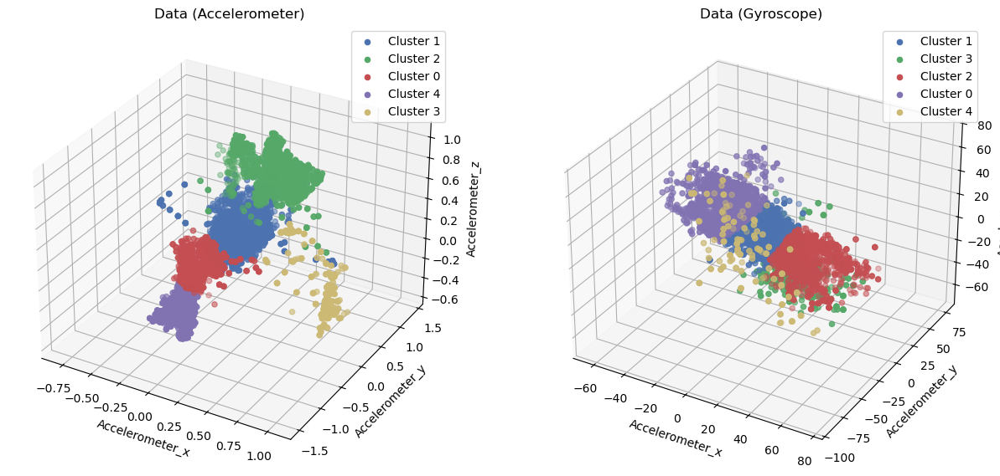

In [39]:
# plot the clusters for accelerometer
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(121, projection='3d')
for c in df_cluster["cluster_acc"].unique():
    subset = df_cluster[df_cluster["cluster_acc"] == c]
    ax.scatter(subset["Accelerometer_x"], subset["Accelerometer_y"], subset["Accelerometer_z"], label=f"Cluster {c}")
ax.set_xlabel("Accelerometer_x")
ax.set_ylabel("Accelerometer_y")
ax.set_zlabel("Accelerometer_z")
ax.set_title("Data (Accelerometer)")
plt.legend()

# plot the clusters for gyroscope
ax = fig.add_subplot(122, projection='3d')
for c in df_cluster["cluster_gyro"].unique():
    subset = df_cluster[df_cluster["cluster_gyro"] == c]
    ax.scatter(subset["Gyroscope_x"], subset["Gyroscope_y"], subset["Gyroscope_z"], label=f"Cluster {c}")
ax.set_xlabel("Accelerometer_x")
ax.set_ylabel("Accelerometer_y")
ax.set_zlabel("Accelerometer_z")
ax.set_title("Data (Gyroscope)")
plt.legend()

plt.show()

#### Feature Correlation

Feature correlation shows how much two sensor features change together. High correlation means they move in the same way, while low correlation means they act independently. This helps us spot similar features and understand the data better.

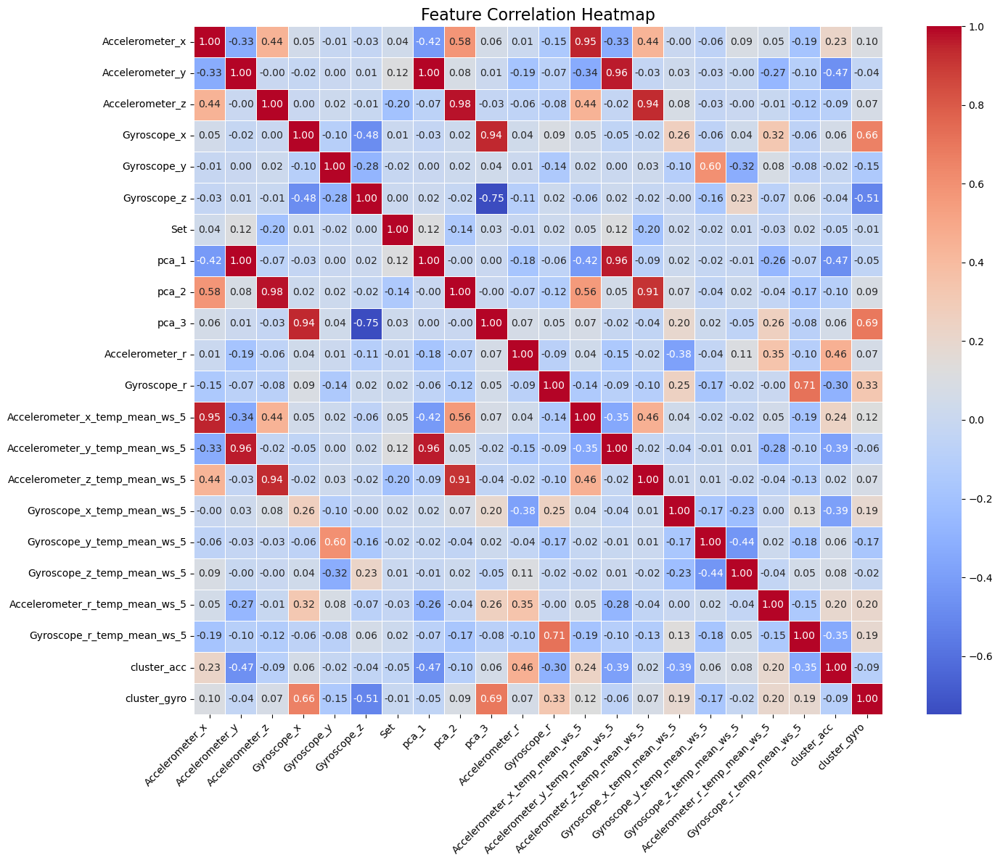

In [40]:
# Exclude non-numeric columns
numeric_columns = df_cluster.select_dtypes(include=[np.number])

# Correlation matrix
correlation_matrix = numeric_columns.corr()

# Plot the heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    cbar=True,
    square=True,
    linewidths=0.5,
    annot_kws={"size": 10}
)
plt.title("Feature Correlation Heatmap", fontsize=16)
plt.xticks(fontsize=10, rotation=45, ha="right")
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

# Part 4: Modeling 
## Training and Testing

In this section, we will use several machine learning models to classify the exercises:

- **Logistic Regression:** A simple model for classification tasks.
- **Random Forest:** Combines many decision trees for better results.
- **Support Vector Machine (SVM):** Finds the best line to separate classes.
- **Decision Tree:** Splits data into branches to make predictions.
- **Naive Bayes:** Uses probability to classify data.
- **K-Nearest Neighbors (KNN):** Looks at the closest data points to decide the class.

We will train and evaluate each model to see which works best for our dataset.


In [41]:
df = df_cluster.copy()
df = df.drop("epoch (ms)", axis=1)

#### Splitting the Dataset

- train set: 80% of the data
- test set: 20% of the data

In [42]:
df_train = df.drop(["Participants", "Category", "Set"], axis=1)

X = df_train.drop("Label", axis=1)
y = df_train["Label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

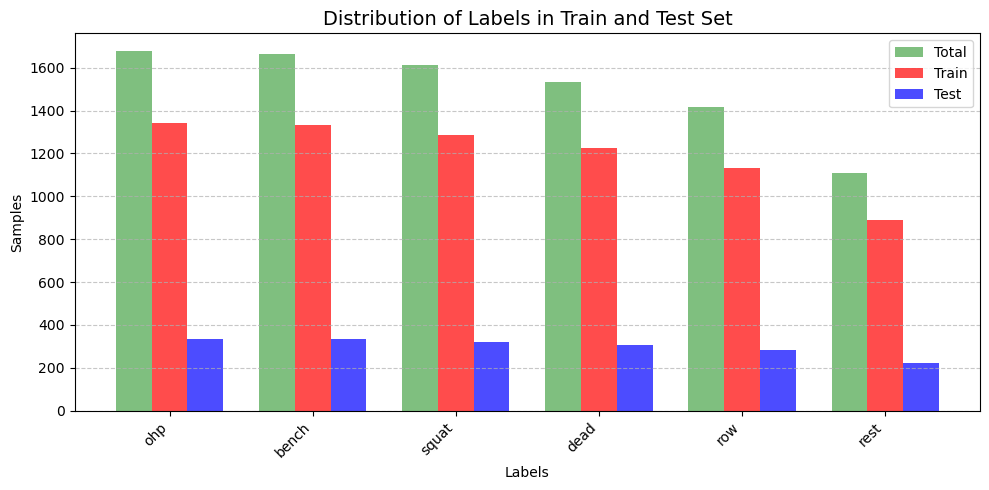

In [43]:
# Define the label order
labels = df_train["Label"].value_counts().index.tolist()

# Get counts, ensuring all labels are present
total_counts = df_train["Label"].value_counts().reindex(labels, fill_value=0)
train_counts = y_train.value_counts().reindex(labels, fill_value=0)
test_counts = y_test.value_counts().reindex(labels, fill_value=0)

# Bar width and positions
x = np.arange(len(labels))
width = 0.25

# Create the plot
fig, ax = plt.subplots(figsize=(10, 5))

# Plot bars with manual offsets
ax.bar(x - width, total_counts, width=width, label='Total', color="green", alpha=0.5)
ax.bar(x, train_counts, width=width, label='Train', color="red", alpha=0.7)
ax.bar(x + width, test_counts, width=width, label='Test', color="blue", alpha=0.7)

# Improve appearance
ax.set_title("Distribution of Labels in Train and Test Set", fontsize=14)
ax.set_xlabel("Labels")
ax.set_ylabel("Samples")
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha="right")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


In [44]:
print("Train set:")
print(y_train.value_counts())
print("\nTest set:")
print(y_test.value_counts())
print("\nTotal set:")
print(df_train["Label"].value_counts())

Train set:
Label
ohp      1341
bench    1332
squat    1288
dead     1225
row      1133
rest      888
Name: count, dtype: int64

Test set:
Label
ohp      335
bench    333
squat    322
dead     306
row      284
rest     222
Name: count, dtype: int64

Total set:
Label
ohp      1676
bench    1665
squat    1610
dead     1531
row      1417
rest     1110
Name: count, dtype: int64


#### Splitting the features

Split the features into different groups (e.g., raw sensor values, PCA components, squared features, mean features) to compare their performance and understand which features work best for classification.

In [45]:
# split the features 
basic_features = ["Accelerometer_x", "Accelerometer_y", "Accelerometer_z", "Gyroscope_x", "Gyroscope_y", "Gyroscope_z"]
squere_feactures = ["Accelerometer_r", "Gyroscope_r"]
pca_feactures = ["pca_1", "pca_2", "pca_3"]
cluster_feactures = ["cluster_acc", "cluster_gyro"]

print(f"Basic features: ", len(basic_features))
print(f"Squere features: ", len(squere_feactures))
print(f"PCA features: ", len(pca_feactures))
print(f"Cluster features: ", len(cluster_feactures))



Basic features:  6
Squere features:  2
PCA features:  3
Cluster features:  2


In [46]:
del set

# creating the feature sets
feature_set_1 = list(set(basic_features))
feature_set_2 = list(set(feature_set_1 + squere_feactures))
feature_set_3 = list(set(feature_set_2 + pca_feactures))
feature_set_4 = list(set(feature_set_3 + cluster_feactures))
feature_set_5 = list(set(feature_set_4) - set(feature_set_1))

#### Forward Feature Selection

Forward selection adds features one by one, each time choosing the feature that most improves model accuracy, up to a maximum of 10 features.

This method helps identify the most important features while keeping the model simple.

In [47]:
# preform forword selection using decision tree
X_train = X_train.select_dtypes(exclude=['datetime64[ns]'])

# select 10 best features
learner = ClassificationAlgorithms()

max_features = 10
selected_features, ordered_scores = learner.forward_selection(max_features, X_train, y_train)

Starting forward selection...
Selecting feature 1/10...
After selecting feature 1/10, selected features: ['pca_1']
Selecting feature 2/10...
After selecting feature 2/10, selected features: ['pca_1', 'Accelerometer_z']
Selecting feature 3/10...
After selecting feature 3/10, selected features: ['pca_1', 'Accelerometer_z', 'Accelerometer_x']
Selecting feature 4/10...
After selecting feature 4/10, selected features: ['pca_1', 'Accelerometer_z', 'Accelerometer_x', 'Gyroscope_r_temp_mean_ws_5']
Selecting feature 5/10...
After selecting feature 5/10, selected features: ['pca_1', 'Accelerometer_z', 'Accelerometer_x', 'Gyroscope_r_temp_mean_ws_5', 'Accelerometer_y_temp_mean_ws_5']
Selecting feature 6/10...
After selecting feature 6/10, selected features: ['pca_1', 'Accelerometer_z', 'Accelerometer_x', 'Gyroscope_r_temp_mean_ws_5', 'Accelerometer_y_temp_mean_ws_5', 'Gyroscope_z_temp_mean_ws_5']
Selecting feature 7/10...
After selecting feature 7/10, selected features: ['pca_1', 'Accelerometer_z

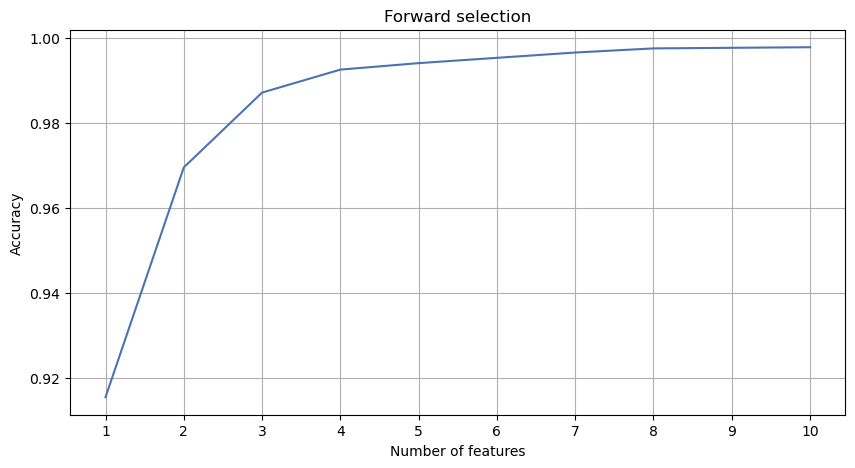

In [48]:
plt.figure(figsize=(10, 5))
plt.plot(np.arange(1, max_features + 1, 1), ordered_scores)
plt.xlabel("Number of features")
plt.ylabel("Accuracy")
plt.xticks(np.arange(1, max_features + 1, 1))
plt.title("Forward selection")
plt.grid()
plt.show()

#### Training and Evaluating Models

In [49]:
# Feature sets
possible_feature_sets = [feature_set_1, feature_set_2, feature_set_3, feature_set_4, feature_set_5, selected_features]
feature_names = ["Feature Set 1", "Feature Set 2", "Feature Set 3", "Feature Set 4", "Feature Set 5", "Selected features"]

In [50]:
# Trained models
trained_models = []

In [93]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

#### KNN

- **KNN**: K-Nearest Neighbors is a simple algorithm that classifies data points based on the classes of their nearest neighbors. It works well for small datasets and is easy to understand.
- **KNN Parameters**: We will use a range of `k` values (1 to 20) to find the best number of neighbors for classification.

##### Train

In [94]:
 # KNN - Training
score_df_train_knn = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])
trained_knn_models = []

for i, f in enumerate(possible_feature_sets):
    print(f"\nTraining KNN - Feature Set: {feature_names[i]}")

    X_train_subset = X_train[f]
    pred_train, _, knn_model = learner.k_nearest_neighbor(
        X_train_subset, y_train, X_train_subset, gridsearch=True
    )
    trained_knn_models.append(knn_model)

    train_acc = accuracy_score(y_train, pred_train)
    print(f"Training Accuracy: {train_acc:.4f}")

    score_df_train_knn = pd.concat([
        score_df_train_knn,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "KNN",
            "Accuracy": train_acc
        }])
    ], ignore_index=True)


Training KNN - Feature Set: Feature Set 1
               Best parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 15, 'p': 2, 'weights': 'distance'}
Training Accuracy: 1.0000

Training KNN - Feature Set: Feature Set 2
               Best parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
Training Accuracy: 1.0000

Training KNN - Feature Set: Feature Set 3
               Best parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
Training Accuracy: 1.0000

Training KNN - Feature Set: Feature Set 4
               Best parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'distance'}
Training Accuracy: 1.

#### Test

In [95]:
# KNN - Testing
score_df_test_knn = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])

for i, f in enumerate(possible_feature_sets):
    print(f"\nTesting KNN - Feature Set: {feature_names[i]}")

    X_test_subset = X_test[f]
    knn_model = trained_knn_models[i]
    y_test_pred = knn_model.predict(X_test_subset)

    test_acc = accuracy_score(y_test, y_test_pred)
    print(f"Test Accuracy: {test_acc:.4f}")

    score_df_test_knn = pd.concat([
        score_df_test_knn,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "KNN",
            "Accuracy": test_acc
        }])
    ], ignore_index=True)



Testing KNN - Feature Set: Feature Set 1
Test Accuracy: 0.8535

Testing KNN - Feature Set: Feature Set 2
Test Accuracy: 0.8529

Testing KNN - Feature Set: Feature Set 3
Test Accuracy: 0.8585

Testing KNN - Feature Set: Feature Set 4
Test Accuracy: 0.8746

Testing KNN - Feature Set: Feature Set 5
Test Accuracy: 0.8657

Testing KNN - Feature Set: Selected features
Test Accuracy: 0.9173


#### KNN is Overfitting

KNN works by memorizing the training data. 

Because we are using noisy signals (gyroscope and accelerometer), KNN with small k (like 1 or 5) just learns the noise, not the real patterns. 

That’s why it performs very well on training data but worse on test data — this is overfitting.


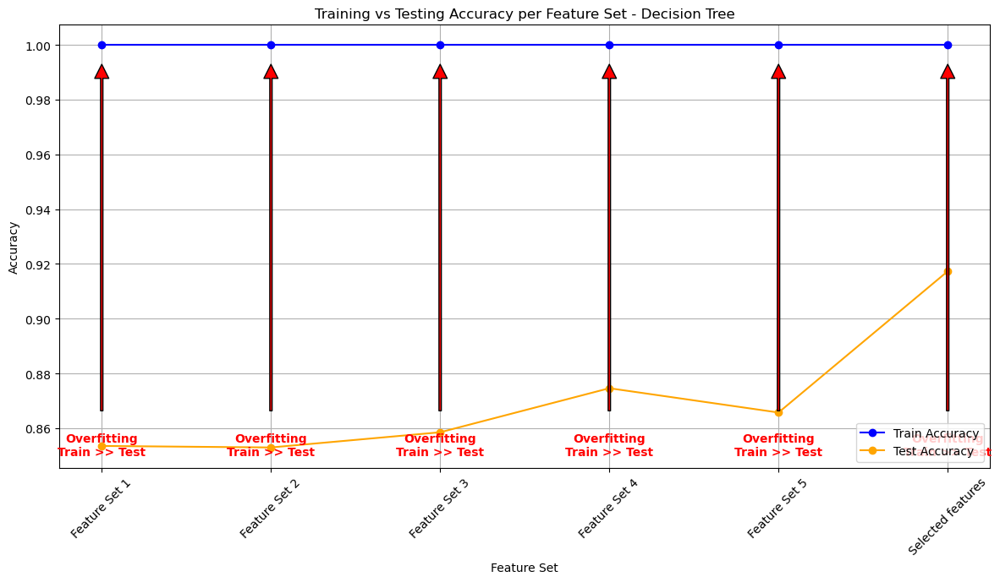

In [ ]:
df_plot = score_df_train_knn[['Feature Set', 'Accuracy']].copy()
df_plot.rename(columns={'Accuracy': 'Train Accuracy'}, inplace=True)
df_plot['Test Accuracy'] = score_df_test_knn['Accuracy']

plt.figure(figsize=(12,7))

# Plot training and testing accuracy lines with markers
plt.plot(df_plot['Feature Set'], df_plot['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(df_plot['Feature Set'], df_plot['Test Accuracy'], marker='o', label='Test Accuracy', color='orange')

plt.xticks(rotation=45)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy per Feature Set - Decision Tree')

# Draw arrows and text explaining overfitting where gap is large
for i in range(len(df_plot)):
    train_acc = df_plot.loc[i, 'Train Accuracy']
    test_acc = df_plot.loc[i, 'Test Accuracy']
    gap = train_acc - test_acc
    
    # If gap > threshold, annotate
    if gap > 0.05:
        plt.annotate(
            'Overfitting\nTrain >> Test',
            xy=(i, train_acc),
            xytext=(i, train_acc - 0.15),
            arrowprops=dict(facecolor='red', shrink=0.05, width=2),
            ha='center',
            color='red',
            fontsize=10,
            fontweight='bold'
        )

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#### NB

#### Train

In [99]:
# Naive Bayes - Training
score_df_train_nb = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])
trained_nb_models = []

for i, f in enumerate(possible_feature_sets):
    print(f"\nTraining Naive Bayes - Feature Set: {feature_names[i]}")

    X_train_subset = X_train[f]
    pred_train, _, nb_model = learner.naive_bayes(
        X_train_subset, y_train, X_train_subset
    )
    trained_nb_models.append(nb_model)

    train_acc = accuracy_score(y_train, pred_train)
    print(f"Training Accuracy: {train_acc:.4f}")

    score_df_train_nb = pd.concat([
        score_df_train_nb,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Naive Bayes",
            "Accuracy": train_acc
        }])
    ], ignore_index=True)



Training Naive Bayes - Feature Set: Feature Set 1
Training Accuracy: 0.8600

Training Naive Bayes - Feature Set: Feature Set 2
Training Accuracy: 0.8614

Training Naive Bayes - Feature Set: Feature Set 3
Training Accuracy: 0.8481

Training Naive Bayes - Feature Set: Feature Set 4
Training Accuracy: 0.8367

Training Naive Bayes - Feature Set: Feature Set 5
Training Accuracy: 0.7654

Training Naive Bayes - Feature Set: Selected features
Training Accuracy: 0.8854


#### Test

In [100]:

# Naive Bayes - Testing
score_df_test_nb = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])

for i, f in enumerate(possible_feature_sets):
    print(f"\nTesting Naive Bayes - Feature Set: {feature_names[i]}")

    X_test_subset = X_test[f]
    nb_model = trained_nb_models[i]
    y_test_pred = nb_model.predict(X_test_subset)

    test_acc = accuracy_score(y_test, y_test_pred)
    print(f"Test Accuracy: {test_acc:.4f}")

    score_df_test_nb = pd.concat([
        score_df_test_nb,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Naive Bayes",
            "Accuracy": test_acc
        }])
    ], ignore_index=True)


Testing Naive Bayes - Feature Set: Feature Set 1
Test Accuracy: 0.8602

Testing Naive Bayes - Feature Set: Feature Set 2
Test Accuracy: 0.8579

Testing Naive Bayes - Feature Set: Feature Set 3
Test Accuracy: 0.8430

Testing Naive Bayes - Feature Set: Feature Set 4
Test Accuracy: 0.8330

Testing Naive Bayes - Feature Set: Feature Set 5
Test Accuracy: 0.7653

Testing Naive Bayes - Feature Set: Selected features
Test Accuracy: 0.8774


#### Performance

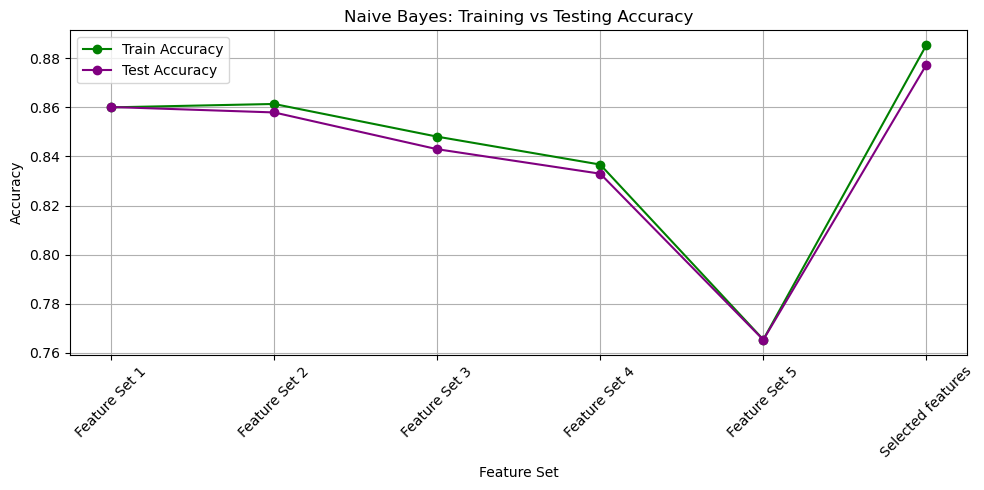

In [ ]:
# Prepare dataframe for plotting
df_nb_plot = score_df_train_nb[['Feature Set', 'Accuracy']].copy()
df_nb_plot.rename(columns={'Accuracy': 'Train Accuracy'}, inplace=True)
df_nb_plot['Test Accuracy'] = score_df_test_nb['Accuracy']

plt.figure(figsize=(10,5))

# Plot training and testing accuracy lines
plt.plot(df_nb_plot['Feature Set'], df_nb_plot['Train Accuracy'], marker='o', label='Train Accuracy', color='green')
plt.plot(df_nb_plot['Feature Set'], df_nb_plot['Test Accuracy'], marker='o', label='Test Accuracy', color='purple')

plt.xticks(rotation=45)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Naive Bayes: Training vs Testing Accuracy')

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


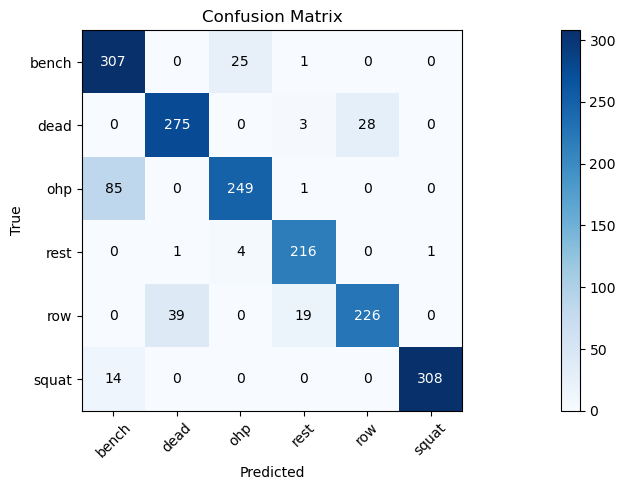

In [114]:
# Get true labels and input data
y_true = y_test
X_selected = X_test[selected_features]

# Get the trained model
model = trained_nb_models[5]

# Predict with the model
y_pred = model.predict(X_selected)

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Get the list of classes
classes = np.unique(y_true)

# Plot confusion matrix
plt.imshow(cm, cmap='Blues')
plt.title('Confusion Matrix')
plt.colorbar()

# Set tick marks and labels
plt.xticks(np.arange(len(classes)), classes, rotation=45)
plt.yticks(np.arange(len(classes)), classes)

# Add numbers inside the boxes
thresh = cm.max() / 2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    color = 'white' if cm[i, j] > thresh else 'black'
    plt.text(j, i, str(cm[i, j]), ha='center', va='center', color=color)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()



#### LR

#### Train

In [126]:
# Logistic Regression - Training
score_df_train_lr = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])
trained_lr_models = []

for i, f in enumerate(possible_feature_sets):
    print(f"\nTraining Logistic Regression  - Feature Set: {feature_names[i]}")

    X_train_subset = X_train[f]
    pred_train, _, lr_model = learner.logistic_regression(
        X_train_subset, y_train, X_train_subset
    )
    trained_lr_models.append(lr_model)

    train_acc = accuracy_score(y_train, pred_train)
    print(f"Training Accuracy: {train_acc:.4f}")

    score_df_train_lr = pd.concat([
        score_df_train_lr,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Logistic Regression",
            "Accuracy": train_acc
        }])
    ], ignore_index=True)



Training Logistic Regression  - Feature Set: Feature Set 1
               Best parameters: {'C': 10, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'deprecated', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Training Accuracy: 0.7780

Training Logistic Regression  - Feature Set: Feature Set 2
               Best parameters: {'C': 10, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'deprecated', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Training Accuracy: 0.8059

Training Logistic Regression  - Feature Set: Feature Set 3
               Best parameters: {'C': 10, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ra

#### Test

In [127]:
# Logistic Regression - Testing
score_df_test_lr = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])

for i, f in enumerate(possible_feature_sets):
    print(f"\nTesting Logistic Refìgression - Feature Set: {feature_names[i]}")

    X_test_subset = X_test[f]
    lr_model = trained_lr_models[i]
    y_test_pred = lr_model.predict(X_test_subset)

    test_acc = accuracy_score(y_test, y_test_pred)
    print(f"Test Accuracy: {test_acc:.4f}")

    score_df_test_lr = pd.concat([
        score_df_test_lr,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Logistic Regression",
            "Accuracy": test_acc
        }])
    ], ignore_index=True)


Testing Logistic Refìgression - Feature Set: Feature Set 1
Test Accuracy: 0.7592

Testing Logistic Refìgression - Feature Set: Feature Set 2
Test Accuracy: 0.7969

Testing Logistic Refìgression - Feature Set: Feature Set 3
Test Accuracy: 0.7963

Testing Logistic Refìgression - Feature Set: Feature Set 4
Test Accuracy: 0.7947

Testing Logistic Refìgression - Feature Set: Feature Set 5
Test Accuracy: 0.7542

Testing Logistic Refìgression - Feature Set: Selected features
Test Accuracy: 0.8135


##### Performace

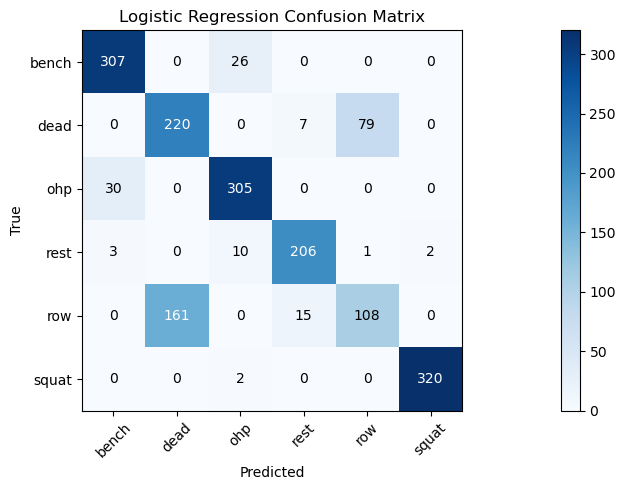

In [128]:
# True labels and input data
y_true = y_test
X_selected = X_test[selected_features]

# Get the trained logistic regression model
model = trained_lr_models[5]  # make sure you have this list from training

# Predict
y_pred = model.predict(X_selected)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Classes
classes = np.unique(y_true)

# Plot confusion matrix
plt.imshow(cm, cmap='Blues')
plt.title('Logistic Regression Confusion Matrix')
plt.colorbar()
plt.xticks(np.arange(len(classes)), classes, rotation=45)
plt.yticks(np.arange(len(classes)), classes)

thresh = cm.max() / 2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    color = 'white' if cm[i, j] > thresh else 'black'
    plt.text(j, i, str(cm[i, j]), ha='center', va='center', color=color)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()


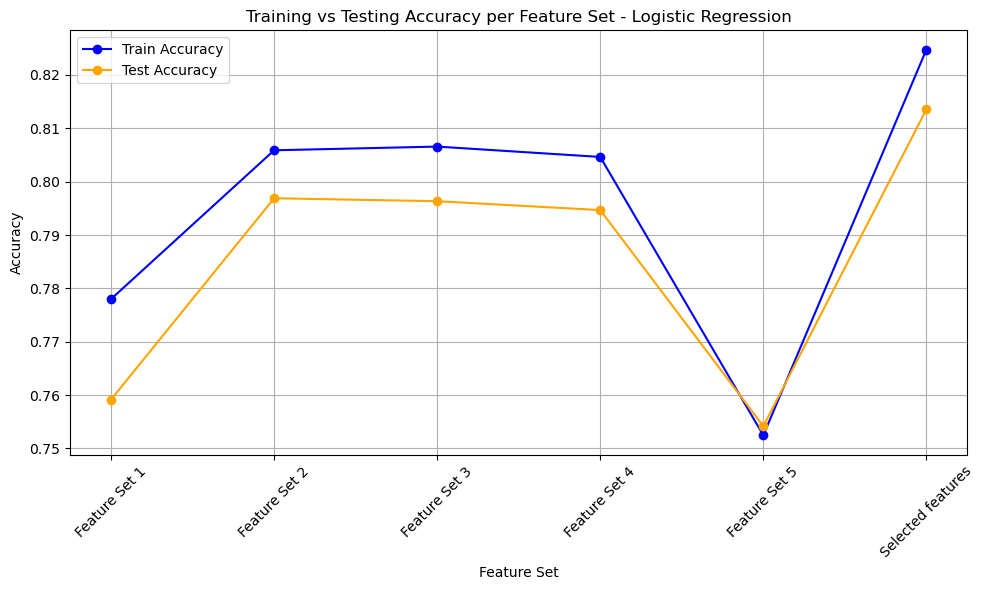

In [129]:
# Prepare combined dataframe for plotting
df_plot = score_df_train_lr[['Feature Set', 'Accuracy']].copy()
df_plot.rename(columns={'Accuracy': 'Train Accuracy'}, inplace=True)
df_plot['Test Accuracy'] = score_df_test_lr['Accuracy']

plt.figure(figsize=(10,6))

plt.plot(df_plot['Feature Set'], df_plot['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(df_plot['Feature Set'], df_plot['Test Accuracy'], marker='o', label='Test Accuracy', color='orange')

plt.xticks(rotation=45)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy per Feature Set - Logistic Regression')

# Optional: highlight possible overfitting
for i in range(len(df_plot)):
    train_acc = df_plot.loc[i, 'Train Accuracy']
    test_acc = df_plot.loc[i, 'Test Accuracy']
    gap = train_acc - test_acc
    
    if gap > 0.05:
        plt.annotate('Possible Overfitting',
                     xy=(i, train_acc),
                     xytext=(i, train_acc - 0.1),
                     arrowprops=dict(facecolor='red', shrink=0.05),
                     ha='center',
                     color='red',
                     fontsize=9)

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#### SVM

#### Training

In [130]:
# SVM - Training
score_df_train_svm = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])
trained_svm_models = []

for i, f in enumerate(possible_feature_sets):
    print(f"\nTraining SVM - Feature Set: {feature_names[i]}")

    X_train_subset = X_train[f]
    pred_train, _, svm_model = learner.svm_without_kernel(
        X_train_subset, y_train, X_train_subset
    )
    trained_svm_models.append(svm_model)

    train_acc = accuracy_score(y_train, pred_train)
    print(f"Training Accuracy: {train_acc:.4f}")

    score_df_train_svm = pd.concat([
        score_df_train_svm,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "SVM",
            "Accuracy": train_acc
        }])
    ], ignore_index=True)


Training SVM - Feature Set: Feature Set 1
               Best parameters: {'C': 10, 'class_weight': None, 'dual': 'auto', 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': None, 'tol': 0.001, 'verbose': 0}
Training Accuracy: 0.7683

Training SVM - Feature Set: Feature Set 2
               Best parameters: {'C': 10, 'class_weight': None, 'dual': 'auto', 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': None, 'tol': 0.0001, 'verbose': 0}
Training Accuracy: 0.8067

Training SVM - Feature Set: Feature Set 3
               Best parameters: {'C': 100, 'class_weight': None, 'dual': 'auto', 'fit_intercept': True, 'intercept_scaling': 1, 'loss': 'squared_hinge', 'max_iter': 1000, 'multi_class': 'ovr', 'penalty': 'l2', 'random_state': None, 'tol': 0.001, 'verbose': 0}
Training Accuracy: 0.8074

Training SVM 

#### Test

In [131]:
# SVM - Testing
score_df_test_svm = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])

for i, f in enumerate(possible_feature_sets):
    print(f"\nTesting SVM - Feature Set: {feature_names[i]}")

    X_test_subset = X_test[f]
    svm_model = trained_svm_models[i]
    y_test_pred = svm_model.predict(X_test_subset)

    test_acc = accuracy_score(y_test, y_test_pred)
    print(f"Test Accuracy: {test_acc:.4f}")

    score_df_test_svm = pd.concat([
        score_df_test_svm,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "SVM",
            "Accuracy": test_acc
        }])
    ], ignore_index=True)


Testing SVM - Feature Set: Feature Set 1
Test Accuracy: 0.7481

Testing SVM - Feature Set: Feature Set 2
Test Accuracy: 0.7969

Testing SVM - Feature Set: Feature Set 3
Test Accuracy: 0.7952

Testing SVM - Feature Set: Feature Set 4
Test Accuracy: 0.7908

Testing SVM - Feature Set: Feature Set 5
Test Accuracy: 0.7586

Testing SVM - Feature Set: Selected features
Test Accuracy: 0.8024


#### Performace

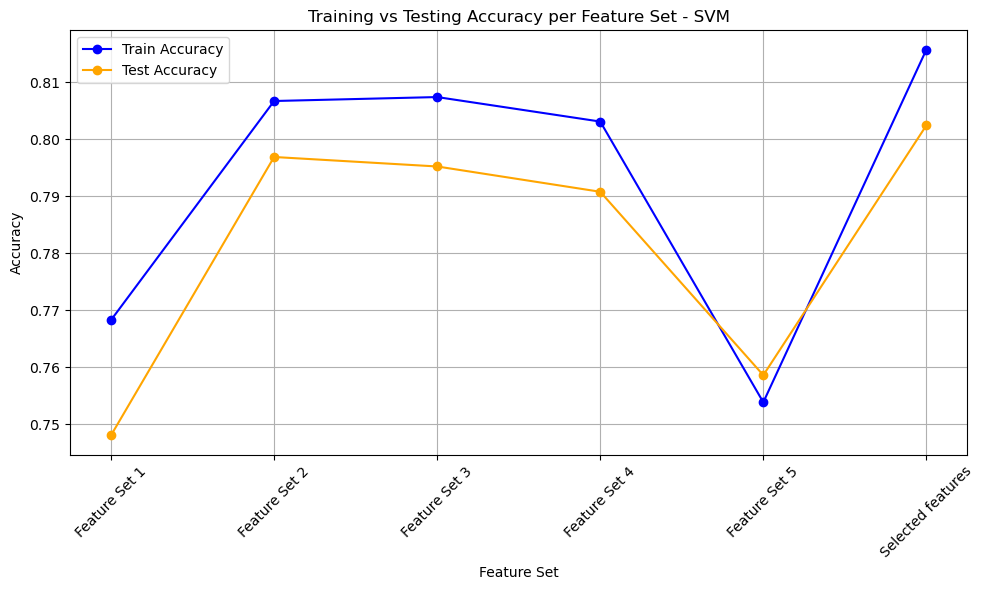

In [133]:
# Combine train and test accuracies for plotting
df_plot = score_df_train_svm[['Feature Set', 'Accuracy']].copy()
df_plot.rename(columns={'Accuracy': 'Train Accuracy'}, inplace=True)
df_plot['Test Accuracy'] = score_df_test_svm['Accuracy']

plt.figure(figsize=(10,6))

plt.plot(df_plot['Feature Set'], df_plot['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(df_plot['Feature Set'], df_plot['Test Accuracy'], marker='o', label='Test Accuracy', color='orange')

plt.xticks(rotation=45)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy per Feature Set - SVM')

# Highlight possible overfitting when train accuracy much higher than test
for i in range(len(df_plot)):
    train_acc = df_plot.loc[i, 'Train Accuracy']
    test_acc = df_plot.loc[i, 'Test Accuracy']
    gap = train_acc - test_acc
    
    if gap > 0.05:
        plt.annotate('Possible Overfitting',
                     xy=(i, train_acc),
                     xytext=(i, train_acc - 0.1),
                     arrowprops=dict(facecolor='red', shrink=0.05),
                     ha='center',
                     color='red',
                     fontsize=9)

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


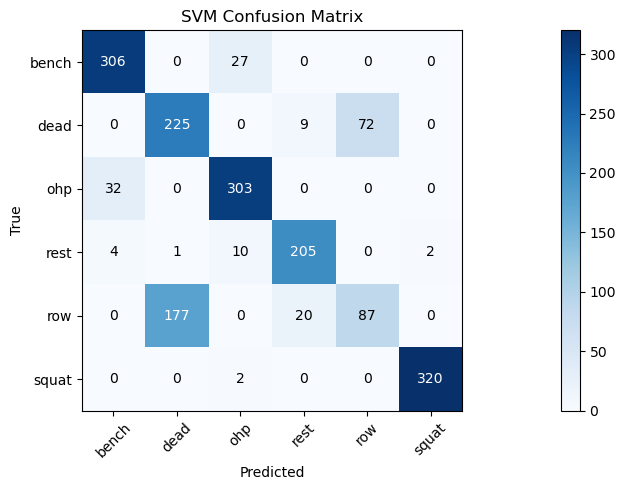

In [ ]:
model_index = 5  # example index
selected_features = possible_feature_sets[model_index]  # or replace with your own list

# True labels and test data subset
y_true = y_test
X_selected = X_test[selected_features]

# Trained SVM model from your list
model = trained_svm_models[model_index]

# Predict
y_pred = model.predict(X_selected)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Get unique class labels
classes = np.unique(y_true)

# Plot confusion matrix
plt.imshow(cm, cmap='Blues')
plt.title('SVM Confusion Matrix')
plt.colorbar()
plt.xticks(np.arange(len(classes)), classes, rotation=45)
plt.yticks(np.arange(len(classes)), classes)

thresh = cm.max() / 2
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    color = 'white' if cm[i, j] > thresh else 'black'
    plt.text(j, i, str(cm[i, j]), ha='center', va='center', color=color)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()


#### DT

#### Training

In [134]:
# Decision Tree - Training
score_df_train_dt = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])
trained_dt_models = []

for i, f in enumerate(possible_feature_sets):
    print(f"\nTraining Decision Tree - Feature Set: {feature_names[i]}")

    X_train_subset = X_train[f]
    pred_train, _, dt_model = learner.decision_tree(
        X_train_subset, y_train, X_train_subset
    )
    trained_dt_models.append(dt_model)

    train_acc = accuracy_score(y_train, pred_train)
    print(f"Training Accuracy: {train_acc:.4f}")

    score_df_train_dt = pd.concat([
        score_df_train_dt,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Decision Tree",
            "Accuracy": train_acc
        }])
    ], ignore_index=True)



Training Decision Tree - Feature Set: Feature Set 1
Training Accuracy: 0.9947

Training Decision Tree - Feature Set: Feature Set 2
Training Accuracy: 0.9939

Training Decision Tree - Feature Set: Feature Set 3
Training Accuracy: 0.9939

Training Decision Tree - Feature Set: Feature Set 4
Training Accuracy: 0.9938

Training Decision Tree - Feature Set: Feature Set 5
Training Accuracy: 0.9879

Training Decision Tree - Feature Set: Selected features
Training Accuracy: 0.9978


#### Testing 

In [135]:

# Decision Tree - Testing
score_df_test_dt = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])

for i, f in enumerate(possible_feature_sets):
    print(f"\nTesting Decision Tree - Feature Set: {feature_names[i]}")

    X_test_subset = X_test[f]
    dt_model = trained_dt_models[i]
    y_test_pred = dt_model.predict(X_test_subset)

    test_acc = accuracy_score(y_test, y_test_pred)
    print(f"Test Accuracy: {test_acc:.4f}")

    score_df_test_dt = pd.concat([
        score_df_test_dt,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Decision Tree",
            "Accuracy": test_acc
        }])
    ], ignore_index=True)


Testing Decision Tree - Feature Set: Feature Set 1
Test Accuracy: 0.9417

Testing Decision Tree - Feature Set: Feature Set 2
Test Accuracy: 0.9423

Testing Decision Tree - Feature Set: Feature Set 3
Test Accuracy: 0.9406

Testing Decision Tree - Feature Set: Feature Set 4
Test Accuracy: 0.9384

Testing Decision Tree - Feature Set: Feature Set 5
Test Accuracy: 0.8951

Testing Decision Tree - Feature Set: Selected features
Test Accuracy: 0.9700


### Overfitting

Why does this look like overfitting?
Training accuracy is extremely high (~99.5%)
This means the model fits the training data almost perfectly.
Test accuracy is noticeably lower (~90–97%)
The model performs worse on new, unseen data.
The gap between training and test accuracy is significant (about 3–9%)
This gap is a classic indicator that the model has learned too many specifics from the training set that don't generalize well.


#### Performace

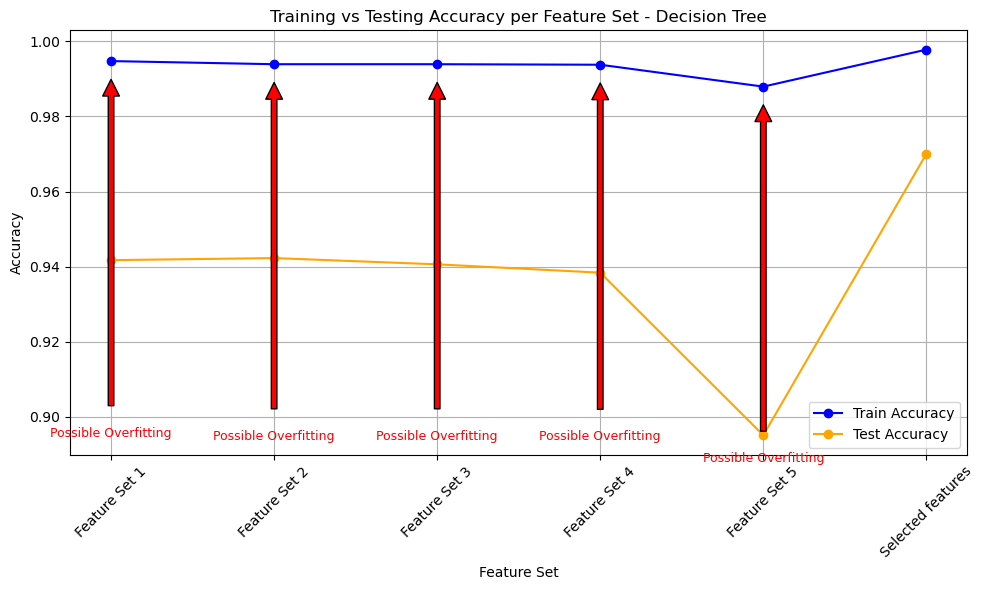

In [137]:
# Prepare dataframe for plotting
df_plot = score_df_train_dt[['Feature Set', 'Accuracy']].copy()
df_plot.rename(columns={'Accuracy': 'Train Accuracy'}, inplace=True)
df_plot['Test Accuracy'] = score_df_test_dt['Accuracy']

plt.figure(figsize=(10,6))

plt.plot(df_plot['Feature Set'], df_plot['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(df_plot['Feature Set'], df_plot['Test Accuracy'], marker='o', label='Test Accuracy', color='orange')

plt.xticks(rotation=45)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy per Feature Set - Decision Tree')

# Annotate possible overfitting where train accuracy is significantly higher
for i in range(len(df_plot)):
    train_acc = df_plot.loc[i, 'Train Accuracy']
    test_acc = df_plot.loc[i, 'Test Accuracy']
    gap = train_acc - test_acc
    
    if gap > 0.05:
        plt.annotate('Possible Overfitting',
                     xy=(i, train_acc),
                     xytext=(i, train_acc - 0.1),
                     arrowprops=dict(facecolor='red', shrink=0.05),
                     ha='center',
                     color='red',
                     fontsize=9)

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#### RF 

#### Train

In [140]:
# Random Forest - Training
score_df_train_rf = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])
trained_rf_models = []

for i, f in enumerate(possible_feature_sets):
    print(f"\nTraining Random Forest - Feature Set: {feature_names[i]}")

    X_train_subset = X_train[f]
    pred_train, _, rf_model = learner.random_forest(
        X_train_subset, y_train, X_train_subset
    )
    trained_rf_models.append(rf_model)

    train_acc = accuracy_score(y_train, pred_train)
    print(f"Training Accuracy: {train_acc:.4f}")

    score_df_train_rf = pd.concat([
        score_df_train_rf,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Random Forest",
            "Accuracy": train_acc
        }])
    ], ignore_index=True)


Training Random Forest - Feature Set: Feature Set 1
               Best parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 2, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Training Accuracy: 0.9971

Training Random Forest - Feature Set: Feature Set 2
               Best parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 2, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 50, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verb

#### Test

In [141]:
# Random Forest - Testing
score_df_test_rf = pd.DataFrame(columns=["Feature Set", "Model", "Accuracy"])

for i, f in enumerate(possible_feature_sets):
    print(f"\nTesting Random Forest - Feature Set: {feature_names[i]}")

    X_test_subset = X_test[f]
    rf_model = trained_rf_models[i]
    y_test_pred = rf_model.predict(X_test_subset)

    test_acc = accuracy_score(y_test, y_test_pred)
    print(f"Test Accuracy: {test_acc:.4f}")

    score_df_test_rf = pd.concat([
        score_df_test_rf,
        pd.DataFrame([{
            "Feature Set": feature_names[i],
            "Model": "Random Forest",
            "Accuracy": test_acc
        }])
    ], ignore_index=True)


Testing Random Forest - Feature Set: Feature Set 1
Test Accuracy: 0.9600

Testing Random Forest - Feature Set: Feature Set 2
Test Accuracy: 0.9650

Testing Random Forest - Feature Set: Feature Set 3
Test Accuracy: 0.9667

Testing Random Forest - Feature Set: Feature Set 4
Test Accuracy: 0.9689

Testing Random Forest - Feature Set: Feature Set 5
Test Accuracy: 0.9323

Testing Random Forest - Feature Set: Selected features
Test Accuracy: 0.9789


#### Performance

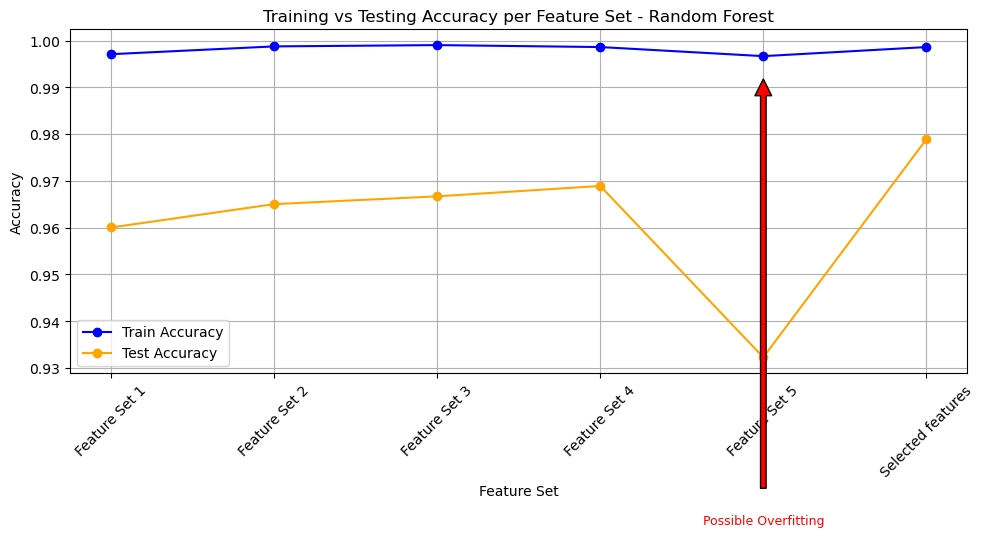

In [142]:
# Combine train and test accuracies for plotting
df_plot = score_df_train_rf[['Feature Set', 'Accuracy']].copy()
df_plot.rename(columns={'Accuracy': 'Train Accuracy'}, inplace=True)
df_plot['Test Accuracy'] = score_df_test_rf['Accuracy']

plt.figure(figsize=(10,6))

plt.plot(df_plot['Feature Set'], df_plot['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(df_plot['Feature Set'], df_plot['Test Accuracy'], marker='o', label='Test Accuracy', color='orange')

plt.xticks(rotation=45)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Training vs Testing Accuracy per Feature Set - Random Forest')

# Highlight possible overfitting where train accuracy much higher than test accuracy
for i in range(len(df_plot)):
    train_acc = df_plot.loc[i, 'Train Accuracy']
    test_acc = df_plot.loc[i, 'Test Accuracy']
    gap = train_acc - test_acc
    
    if gap > 0.05:
        plt.annotate('Possible Overfitting',
                     xy=(i, train_acc),
                     xytext=(i, train_acc - 0.1),
                     arrowprops=dict(facecolor='red', shrink=0.05),
                     ha='center',
                     color='red',
                     fontsize=9)

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


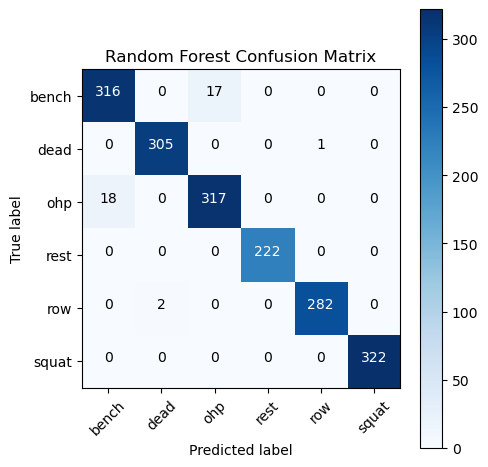

In [143]:
i = 5  

y_true = y_test
X = X_test[possible_feature_sets[i]]
model = trained_rf_models[i]

# Predict test labels
y_pred = model.predict(X)

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Get class labels
classes = np.unique(y_true)

plt.figure(figsize=(5,5))
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.title("Random Forest Confusion Matrix")
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.0
for i_, j_ in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j_, i_, format(cm[i_, j_]),
             horizontalalignment="center",
             color="white" if cm[i_, j_] > thresh else "black")

plt.ylabel("True label")
plt.xlabel("Predicted label")
plt.grid(False)
plt.tight_layout()
plt.show()


#### Combind all the models on the test performace

In [156]:
results = pd.DataFrame({
    "Feature Set": feature_names,
    "Naive Bayes Test Accuracy": score_df_test_nb["Accuracy"],
    "Logistic Regression Test Accuracy": score_df_test_lr["Accuracy"],
    "SVM Test Accuracy": score_df_test_svm["Accuracy"],
    "Random Forest Test Accuracy": score_df_test_rf["Accuracy"]
})

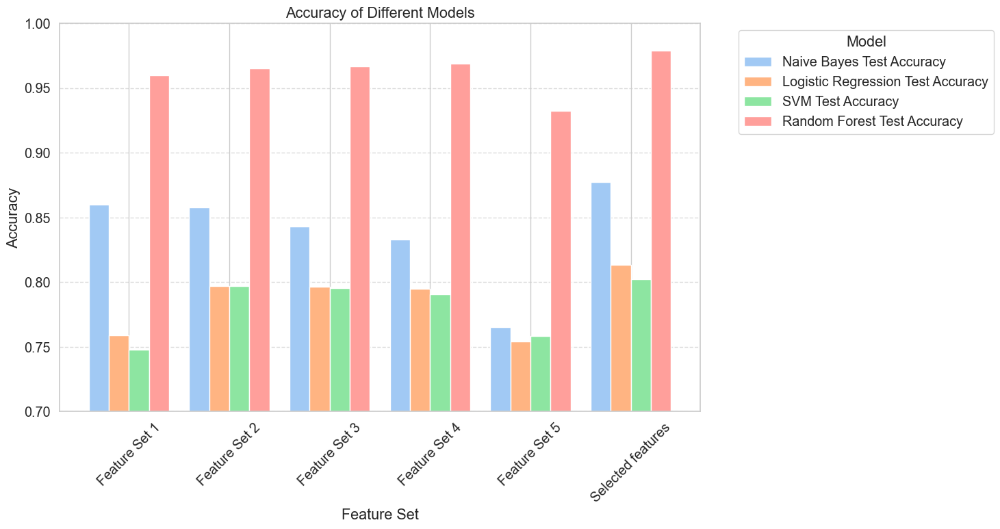

In [171]:
import matplotlib.pyplot as plt
import numpy as np

# Melt the results DataFrame to long format
data = results.melt(id_vars="Feature Set", var_name="Model", value_name="Accuracy")

feature_sets = data['Feature Set'].unique()
models = data['Model'].unique()

bar_width = 0.2
x = np.arange(len(feature_sets))

plt.figure(figsize=(15, 8))

for i, model in enumerate(models):
    acc = data[data['Model'] == model]['Accuracy'].values
    plt.bar(x + i*bar_width, acc, width=bar_width, label=model)

plt.xticks(x + bar_width*(len(models)-1)/2, feature_sets, rotation=45)
plt.ylim(0.7, 1)
plt.xlabel('Feature Set')
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Models')

# Place legend outside the plot on the right
plt.legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Models Comparison

In [176]:
from sklearn.metrics import classification_report
import pandas as pd

# List of models and their trained instances
model_names = [
    "Naive Bayes", "Logistic Regression", "SVM", "Random Forest"
]
trained_models = [
    trained_nb_models[5],
    trained_lr_models[5],
    trained_svm_models[5],
    trained_rf_models[5]
]

# Prepare data
X_selected = X_test[selected_features]
y_true = y_test

# Collect metrics for each model
metrics_list = []
for name, model in zip(model_names, trained_models):
    y_pred = model.predict(X_selected)
    report = classification_report(y_true, y_pred, output_dict=True, zero_division=0)
    for cls in report:
        if cls not in ['accuracy', 'macro avg', 'weighted avg']:
            metrics_list.append({
                'Model': name,
                'Class': cls,
                'Precision': report[cls]['precision'],
                'Recall': report[cls]['recall'],
                'F1-Score': report[cls]['f1-score'],
                'Support': report[cls]['support']
            })

# Create DataFrame
metrics_df_all = pd.DataFrame(metrics_list)

# Display the table
metrics_pivot = metrics_df_all.pivot(index=['Class'], columns='Model', values=['Precision', 'Recall', 'F1-Score'])
metrics_pivot = metrics_pivot.round(3)
display(metrics_pivot)


Precision                                   \
Model Logistic Regression Naive Bayes Random Forest    SVM   
Class                                                        
bench               0.903       0.756         0.946  0.895   
dead                0.577       0.873         0.993  0.558   
ohp                 0.889       0.896         0.949  0.886   
rest                0.904       0.900         1.000  0.876   
row                 0.574       0.890         0.996  0.547   
squat               0.994       0.997         1.000  0.994   

                   Recall                                   \
Model Logistic Regression Naive Bayes Random Forest    SVM   
Class                                                        
bench               0.922       0.922         0.949  0.919   
dead                0.719       0.899         0.997  0.735   
ohp                 0.910       0.743         0.946  0.904   
rest                0.928       0.973         1.000  0.923   
row                 0.380       0.796         0.993  0.306   
squat               0.994       0.957         1.000  0.994   

                 F1-Score                                   
Model Logistic Regression Naive Bayes Random Forest    SVM  
Class                                                       
bench               0.912       0.831         0.948  0.907  
dead                0.640       0.886         0.995  0.635  
ohp                 0.900       0.812         0.948  0.895  
rest                0.916       0.935         1.000  0.899  
row                 0.458       0.840         0.995  0.393  
squat               0.994       0.976         1.000  0.994